# Stock Screener

<u>TABLE OF CONTENTS:</u> 

0. Introduction
1. Data Input & Cleaning
    * 1.1. Stock Tickers  
    * 1.2. Stock Fundamentals (Prices, Volume, Splits, Revenue, Earnings)
    * 1.3. Financial News Sentiment
2. Data Processing/Cleaning
3. Data Visualization/EDA
    * 3.1. Stock Individual Returns Before vs. During COVID-19  
    * 3.2. Stock Sector Returns Before vs. During COVID-19 
    * 3.3. Stock Industry Returns Before vs. During COVID-19 
    * 3.4. Stock Sector Prices Over Time     
    * 3.5. Stock Clustering During COVID-19    
    * 3.6. Financial News Sentiment by Source
    * 3.7. Stock Correlation to Financial News Sentiment 
    * 3.8. Industry/Sector Correlation to Financial News Sentiment   
    * 3.9. Stock Screener (by P/E Ratio, Earnings)      
4. Data Pipeline
5. Conclusion

## 0. Introduction:

The purpose of this project is to evaluate stock prices and employ various machine learning methods to try and predict their behavior in the future. The motivation for this project is due to personal interest (investing), and the fact that stocks provide a wealth of historical data to include in a machine learning problem. Also, I am interested in determining the effect of the COVID-19 pandemic on stocks in general. 

The data sources for this project include scraped news headlines from a variety of top financial news sources (for financial news sentiment), the yahoo finance API (for financial fundamentals such as stock prices, earnings, P/E ratios), and the NASDAQ website (for stock tickers, sectors, and industries). 

This project will try and answer these questions:

- Which stocks have the greatest rate of return before vs. during COVID-19?
- Which sectors have the greatest rate of return before vs. during COVID-19?
- Which industries have the greatest rate of return before vs. during COVID-19?
- How have sector stock prices changed over time during COVID-19?
- Can stock price changes be used to cluster groups of individual stocks?
- Which financial news sources have the highest/lowest headline sentiment? 
- Which stocks are correlated to financial news sentiment?
- Which sectors/industries are correlated to financial news sentiment?
- Can we screen stocks that are good value based on average sector Price/Earnings ratio, and quarterly growth percent?

## 1. Data Input & Cleaning:

In [97]:
# load required libraries
import os
import re
from glob import glob 
import string
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.collections as collections 
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.dates as mdates
from datetime import datetime, time, date
import time

# sklearn libraries
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import normalize

# scraping libraries
from bs4 import BeautifulSoup
from selenium import webdriver
from datetime import timedelta, date, datetime
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from selenium import webdriver
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions 
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By


### 1.1 Stock Tickers:

In [98]:
def get_tickers(url):

    # create driver
    driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()))
    wait = WebDriverWait(driver, 20)
 
    # get url
    driver.get(url)

    # click download button
    button_xpath = "//div[@class = 'nasdaq-screener__download']"
    WebDriverWait(driver, 5).until(expected_conditions.element_to_be_clickable((By.XPATH, button_xpath)))
    button = driver.find_element(By.XPATH, button_xpath)
    button.click()
    time.sleep(5)

    # get current working directory
    current_folder = os.getcwd()

    # set os path for downloads folder
    data_folder = os.path.join("/", "Users", "mcgaritym", "Downloads")

    # get csv(s) from data_folder directory
    file = glob(os.path.join(data_folder, '*nasdaq_screener*.csv'))
    for f in file:
        df_tickers = pd.read_csv(f)

    df_tickers = df_tickers[['Symbol', 'Name', 'Market Cap', 'Sector', 'Industry']]
    df_tickers = df_tickers.dropna(subset=['Market Cap'])
    df_tickers['Market Cap'] = df_tickers['Market Cap'].astype(str)
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('$', ''))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('B', '0000000'))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('M', '0000'))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].apply(lambda x: x.replace('.', ''))
    df_tickers['Market Cap'] = df_tickers['Market Cap'].astype(int)
    df_tickers['Market Cap'] = df_tickers['Market Cap'].sort_values(ascending=False)    
    
    return df_tickers

df_tickers = get_tickers('https://www.nasdaq.com/market-activity/stocks/screener')
df_tickers = df_tickers.sort_values(by='Market Cap', ascending=False)

# print sample data
df_tickers.head()



====== WebDriver manager ======
Current google-chrome version is 96.0.4664
Get LATEST chromedriver version for 96.0.4664 google-chrome
Driver [/Users/mcgaritym/.wdm/drivers/chromedriver/mac64/96.0.4664.45/chromedriver] found in cache


,Symbol,Name,Market Cap,Sector,Industry
18,AAPL,Apple Inc. Common Stock,31099720492000,Technology,Computer Manufacturing
4938,MSFT,Microsoft Corporation Common Stock,25673539128260,Technology,Computer Software: Prepackaged Software
3309,GOOGL,Alphabet Inc. Class A Common Stock,19468861708010,Technology,Internet and Information Services
3308,GOOG,Alphabet Inc. Class C Capital Stock,19448882411790,Technology,Internet and Information Services
452,AMZN,Amazon.com Inc. Common Stock,17161976890320,Consumer Services,Catalog/Specialty Distribution


In [99]:
# print number of companies per sector
print(df_tickers['Sector'].value_counts())

Finance                  1630
Health Care              1135
Technology                833
Consumer Services         747
Capital Goods             472
Consumer Non-Durables     231
Energy                    218
Public Utilities          210
Basic Industries          207
Miscellaneous             187
Consumer Durables         157
Transportation            122
Name: Sector, dtype: int64


In [100]:
# print number of companies per sector
print(df_tickers['Industry'].value_counts())

Biotechnology: Pharmaceutical Preparations    615
Business Services                             368
Major Banks                                   312
EDP Services                                  277
Real Estate Investment Trusts                 262
                                             ... 
Soft Drinks                                     1
Computer Communications Equipment               1
Tools/Hardware                                  1
Diversified Electronic Products                 1
Forest Products                                 1
Name: Industry, Length: 142, dtype: int64


In [135]:
def top_tickers_sector(df, sector):
    
    ticker_list = []
        
    for sec in sector:
                        
        # filter by sector and sort by market cap
        df_tick = df[df['Sector'] == sec].sort_values(by='Market Cap', ascending=False)
        df_tick = list(df_tick.iloc[:10]['Symbol'])   
        
        for tick in df_tick:
            
            ticker_list.append(tick)
                         
    return ticker_list  

In [102]:
# get top 10 tickers of all sectors
all_sectors = list(df_tickers['Sector'].unique())
top_tickers_sector = top_tickers_sector(df_tickers, sector = all_sectors)
print(top_tickers_sector)

['AAPL', 'MSFT', 'GOOGL', 'GOOG', 'FB', 'NVDA', 'TSM', 'ASML', 'AVGO', 'ADBE', 'AMZN', 'HD', 'WMT', 'DIS', 'NFLX', 'COST', 'CMCSA', 'MCD', 'T', 'LOW', 'TSLA', 'TMO', 'TM', 'AMAT', 'RTX', 'BA', 'CAT', 'DE', 'CX', 'LMT', 'UNH', 'JNJ', 'PFE', 'LLY', 'NVO', 'ABT', 'ABBV', 'DHR', 'NVS', 'MRK', 'V', 'MA', 'BABA', 'ACN', 'NTES', 'PYPL', 'ADP', 'JD', 'BAM', 'PDD', 'JPM', 'BAC', 'WFC', 'MS', 'SCHW', 'BLK', 'AMT', 'GS', 'AXP', 'HSBC', 'PG', 'NKE', 'KO', 'PEP', 'SONY', 'PM', 'UL', 'EL', 'DEO', 'BUD', 'XOM', 'CVX', 'BBL', 'TTE', 'COP', 'BP', 'EQNR', 'PTR', 'ENB', 'PBR', 'VZ', 'NEE', 'TMUS', 'DUK', 'SO', 'WM', 'AMX', 'AMOV', 'D', 'EXC', 'UPS', 'UNP', 'ABNB', 'BKNG', 'CSX', 'NSC', 'FDX', 'ODFL', 'EXPE', 'DAL', 'LIN', 'BHP', 'RIO', 'SHW', 'APD', 'VALE', 'FCX', 'NEM', 'KMB', 'SCCO', 'GE', 'ABB', 'FERG', 'AME', 'BLL', 'GNRC', 'CLX', 'AMCR', 'VTRS', 'PLUG']


In [103]:
def top_tickers_industry(df, industry):
    
    ticker_list = []
    
    for ind in industry:
                
        # filter by sector and sort by market cap
        df_tick = df[df['Industry'] == ind].sort_values(by='Market Cap', ascending=False)
        df_tick = list(df_tick.iloc[:3]['Symbol'])   
        
        for tick in df_tick:
            
            ticker_list.append(tick)
                         
    return ticker_list 

In [104]:
# print sample data
all_industries = list(df_tickers['Industry'].unique())
top_tickers_ind = top_tickers_industry(df_tickers, industry = all_industries)
print(top_tickers_ind)

['AAPL', 'DELL', 'HPQ', 'MSFT', 'ADBE', 'CRM', 'GOOGL', 'GOOG', 'FB', 'AMZN', 'MELI', 'EBAY', 'TSLA', 'TM', 'RIVN', 'NVDA', 'TSM', 'AVGO', 'UNH', 'DHR', 'ANTM', 'V', 'MA', 'BABA', 'JPM', 'BAC', 'WFC', 'JNJ', 'PFE', 'LLY', 'HD', 'LOW', 'BLDR', 'PG', 'UL', 'EL', 'WMT', 'COST', 'TGT', 'ASML', 'AMAT', 'DE', 'DIS', 'NFLX', 'LYV', 'CSCO', 'QCOM', 'ANET', 'NKE', 'DECK', 'CROX', 'TMO', 'BIO', 'BRKR', 'XOM', 'TTE', 'PTR', 'KO', 'PEP', 'DEO', 'NVO', 'MRNA', 'BNTX', 'ABT', 'ISRG', 'SYK', 'ABBV', 'MCK', 'ABC', 'CMCSA', 'CHTR', 'ROKU', 'CVX', 'COP', 'BP', 'VZ', 'T', 'TMUS', 'MCD', 'CMG', 'YUM', 'UPS', 'FDX', 'DAL', 'NEE', 'D', 'AEP', 'MS', 'SCHW', 'BLK', 'LIN', 'IFF', 'CTVA', 'UNP', 'CSX', 'NSC', 'SONY', 'WHR', 'VZIO', 'BHP', 'FCX', 'NEM', 'BBL', 'ARLP', 'ARCH', 'PM', 'MO', 'BTI', 'MDT', 'PHG', 'NVCR', 'CVS', 'IQV', 'VEEV', 'AMT', 'NTRS', 'BXSL', 'RTX', 'TDG', 'HEI', 'AXP', 'DFS', 'LU', 'PLD', 'CCI', 'EQIX', 'HSBC', 'PBCT', 'TFSL', 'BA', 'LMT', 'GD', 'HDB', 'MUFG', 'IBN', 'SPGI', 'MCO', 'MSCI', 'CA

### 1.2 Stock Fundamentals (Prices, Volume, Splits, Revenue, Earnings):

In [186]:
# define function for generating stock history of each ticker and concatenate to master dataframe
def stock_preprocess(tickers):

    # create empty dataframe
    df_api = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")
    
    # loop over each stock ticker
    for tick in tickers:
                 
        # input various stock tickers 
        ticker = yf.Ticker(tick)            
            
        try:
                
            # get historical market data
            time.sleep(0.1)
            stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                
        except:
                
            # get historical market data
            time.sleep(5)
            stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
            
        # rename columns unique to eack ticker
        stock_hist = stock_hist[['Close', 'Volume', 'Stock Splits']]
        
        try:
        
            # get quarterly earnings
            stock_earnings = ticker.quarterly_earnings

            # rename columns unique to each ticker, and format dates (assume the earning reporting dates are 1 month after quarter ends)
            stock_earnings = stock_earnings.reset_index()
            stock_earnings['Quarter'] = stock_earnings['Quarter'].str.replace(r'(Q\d) (\d+)', r'\1\2', regex=True)
            stock_earnings['Date'] = pd.PeriodIndex(stock_earnings['Quarter'], freq='Q').to_timestamp()
            stock_earnings['Date'] = pd.to_datetime(stock_earnings['Date'])

            # concat dataframes
            stock_hist = stock_hist.merge(stock_earnings, on='Date', how='outer')

        except:
            
            stock_hist = stock_hist.reset_index()
            
        # sort date values
        stock_hist = stock_hist.set_index('Date')
        stock_hist = stock_hist.sort_index(ascending=True)
        
        # fill in nan values and drop remaining nan values
        stock_hist = stock_hist.fillna(method = 'ffill')
        stock_hist = stock_hist.dropna()
        stock_hist = stock_hist.drop_duplicates()
        
        # rename columns with ticker name
        stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_' + x)
        
        # append to empty dataframe
        stock_hist = stock_hist.loc[~stock_hist.index.duplicated()]
        df_api = df_api.loc[~df_api.index.duplicated()]
        df_api = pd.concat([df_api, stock_hist], axis=1, sort=False)
                        
    # print and specift dataframe is returned    
    return df_api

# print sample data call function with ticker_input
stock_preprocess(['AMZN', 'MSFT']).head()

,AMZN_Close,AMZN_Volume,AMZN_Stock Splits,AMZN_Quarter,AMZN_Revenue,AMZN_Earnings,MSFT_Close,MSFT_Volume,MSFT_Stock Splits,MSFT_Quarter,MSFT_Revenue,MSFT_Earnings
Date,,,,,,,,,,,,
2020-07-01,2878.699951,6363400.0,0.0,3Q2020,9.614500e+10,6.331000e+09,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-02,2890.300049,6593400.0,0.0,3Q2020,9.614500e+10,6.331000e+09,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-06,3057.040039,6880600.0,0.0,3Q2020,9.614500e+10,6.331000e+09,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-07,3000.120117,5257500.0,0.0,3Q2020,9.614500e+10,6.331000e+09,NaN,NaN,NaN,NaN,NaN,NaN
2020-07-08,3081.110107,5037600.0,0.0,3Q2020,9.614500e+10,6.331000e+09,NaN,NaN,NaN,NaN,NaN,NaN


### 1.3 Financial News Sentiment:

In [106]:
# FINANCIAL NEWS HEADLINES - retrieve data
def get_news():
    
    # get current parent directory and data folder path
    par_directory = os.path.dirname(os.getcwd())
    data_directory = os.path.join(par_directory, 'data/raw')

    # specify file names
    files_headlines = glob(os.path.join(data_directory, '*fin_news_headlines*.csv'))

    ## create empty dataframe, loop over files and concatenate data to dataframe. next, reset index and print tail
    df_news = pd.DataFrame()
    for f in files_headlines:
        data = pd.read_csv(f, parse_dates = ['date'])
        df_news = pd.concat([df_news, data], axis=0, sort='False')
    df_news = df_news.dropna()
    df_news = df_news.drop_duplicates()
    
    # reset index, sort values by date and print data sample
    df_news = df_news.reset_index(drop=True)
    df_news = df_news.sort_values(by='date', ascending=True)
    df_news = df_news.rename(columns = {'date': 'Date'})
    df_news['Date'] = pd.to_datetime(df_news['Date'])
    df_news = df_news.set_index('Date')
    
    return df_news

df_news = get_news()
df_news.head()

,headline,org
Date,,
2020-07-12 12:32:37,How to Play Palantir Ahead of a Likely IPO,yahoofinance
2020-07-12 12:32:37,"Notable Insider Buys: Acceleron, Continental A...",yahoofinance
2020-07-12 12:32:37,How to Invest in MLP Stocks,yahoofinance
2020-07-12 12:32:37,Trading set to triumph in US banks’ second-qua...,yahoofinance
2020-07-12 12:32:37,WeWork on track for profits and positive cash ...,yahoofinance


## 2. Data Processing/Cleaning:

In [107]:
def clean_news(df):
  
    # drop nan and duplicate values and filter for headline length more than 3 words
    df_news = df.dropna()
    df_news = df_news.drop_duplicates()
    df_news['headline_length'] = [len(x.split()) for x in df_news['headline']]
    df_news = df_news[df_news['headline_length'] > 3]
    

    # create sentiment column for news headlines
    sid = SentimentIntensityAnalyzer()
    df_news['sentiment'] = df_news['headline'].apply(sid.polarity_scores)
    df_news['sentiment'] = df_news['sentiment'].apply(lambda x: x['compound'])

    # resample daily and groupby organization
    company_sentiment = df_news.groupby('org')['sentiment'].resample('D').mean().unstack(level=0)
    company_sentiment = company_sentiment.rename(columns=lambda x: x + '_sentiment')

    # create overall sentiment column
    company_sentiment['overall_sentiment'] = company_sentiment.mean(axis=1)

    return company_sentiment

df_news = clean_news(df_news)
df_news.head()

org,bloomberg_sentiment,cnbc_sentiment,cnn_sentiment,cnnbusiness_sentiment,economist_sentiment,financialtimes_sentiment,forbes_sentiment,fortune_sentiment,foxbusiness_sentiment,googlenews_sentiment,ibtimes_sentiment,marketwatch_sentiment,morningstar_sentiment,motleyfool_sentiment,msnmoney_sentiment,seekingalpha_sentiment,thestreet_sentiment,wsj_sentiment,yahoofinance_sentiment,overall_sentiment
Date,,,,,,,,,,,,,,,,,,,,
2020-07-12,0.017152,0.041875,0.039259,0.019139,0.039587,-0.026454,0.040205,0.009149,0.063012,0.049029,0.008229,0.071553,0.113454,0.119425,0.083740,-0.058320,0.015396,0.077211,0.123815,0.044550
2020-07-13,-0.091661,0.001616,0.156203,-0.035982,NaN,0.033576,-0.065333,0.016558,-0.049071,0.075603,0.005120,0.026499,0.046334,0.142780,0.042242,0.136375,0.078739,0.024118,0.106491,0.036123
2020-07-14,NaN,0.020116,-0.017741,-0.025709,NaN,-0.044532,-0.055646,0.026998,0.003331,0.003767,-0.061897,-0.021709,0.042848,0.076813,-0.023245,0.078410,0.034927,-0.029538,0.103337,0.006502
2020-07-15,0.000874,0.103024,0.089648,-0.023556,NaN,-0.018404,-0.042343,-0.092772,0.013181,0.081888,0.087323,0.070481,0.138019,0.152580,0.011699,0.106636,0.075157,0.042662,0.098049,0.049675
2020-07-16,-0.033208,0.026437,-0.007182,-0.133523,-0.011429,-0.040083,0.056353,0.021719,0.003442,0.010915,-0.036018,-0.052024,0.126106,0.112117,0.037070,0.095347,0.018700,-0.060121,0.029518,0.008639


## 3. Data Visualization/EDA

### 3.1. Stock Individual Returns Before vs. During COVID-19

In [145]:
from datetime import datetime, date, timezone

# define function to split large ticker lists into chunks
def chunker(seq, size):
    return (seq[pos:pos + size] for pos in range(0, len(seq), size))

# preprocess ticker list to get values
def stock_preprocess_prices(tickers):
    
    # create empty dataframe
    df_api = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")    
    
    # create nested list of 10 tickers each to facilitate processing/requesting
    tickers_list = list(chunker(tickers, 10))
    
    # loop over each stock ticker
    for tickers in tickers_list:
        
        for tick in tickers:

            try:

                # input various stock tickers 
                ticker = yf.Ticker(tick)

                # get historical market data
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)

                # filter columns for closing price
                stock_hist = stock_hist[['Close']]

                # fill in nan values and drop remaining nan values
                stock_hist = stock_hist.interpolate(method='linear', limit_direction = 'forward', axis=0)

                # rename columns with ticker name
                stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_C')

                # concat to empty dataframe
                df_api = pd.concat([df_api, stock_hist], axis=1)

            except:
                pass

    return df_api
        
df_all = stock_preprocess_prices(ticker_list_ind)  
df_all.tail()

,AAPL_C,DELL_C,HPQ_C,MSFT_C,ADBE_C,CRM_C,GOOGL_C,GOOG_C,FB_C,AMZN_C,...,SWBI_C,UVV_C,ANDE_C,TPB_C,UEC_C,USLM_C,WWR_C,MICT_C,CLWT_C,BOSC_C
Date,,,,,,,,,,,,,,,,,,,,,
2021-12-22,175.639999,55.369999,37.279999,333.200012,563.979980,252.800003,2928.300049,2938.979980,330.450012,3420.739990,...,17.620001,53.779999,38.000000,36.490002,3.44,127.080002,2.47,0.970,3.01,2.70
2021-12-23,176.279999,55.880001,37.650002,334.690002,569.619995,253.139999,2938.330078,2942.850098,335.239990,3421.370117,...,17.549999,53.840000,38.110001,36.630001,3.42,129.410004,2.49,0.920,3.11,2.87
2021-12-27,180.330002,56.599998,38.099998,342.450012,577.679993,258.299988,2958.129883,2961.280029,346.179993,3393.389893,...,17.750000,54.119999,38.950001,36.720001,3.86,131.020004,2.40,0.837,3.07,2.90
2021-12-28,179.289993,56.950001,37.950001,341.250000,569.359985,255.449997,2933.739990,2928.959961,346.220001,3413.219971,...,17.590000,54.389999,39.130001,36.650002,3.65,131.820007,2.25,0.830,3.16,2.80
2021-12-29,179.380005,57.049999,37.980000,341.950012,569.289978,254.539993,2933.100098,2930.090088,342.940002,3384.020020,...,17.440001,54.500000,39.040001,36.709999,3.55,129.699997,2.12,0.790,3.12,2.78


In [146]:
def stock_returns(df):
    
    # drop first row of nan values
    df = df.iloc[1:,]
    
    # create empty list
    returns_ = []
    
    # loop over columns
    for x in df.columns:
        
        # create initial val based on pandemic start date, final val based on current date, and calc percent chg
        init_val = df[x].iloc[0]
        # init_val = df.loc['2020-03-02'][x]
        final_val = df[x].iloc[-1]
        pct_chg = ((final_val - init_val)/(init_val))*100
        # append dict to list
        returns_.append(dict({'ticker': x, 'pandemic_change%':pct_chg}))

    # create pandas dataframe based on list 
    df_returns = pd.DataFrame(returns_, columns=['ticker', 'pandemic_change%'])
    df_returns = df_returns.dropna(subset=['pandemic_change%'])
    df_returns = df_returns[df_returns['ticker'] != 'AMOV_C']
    df_returns = df_returns.sort_values(by = 'pandemic_change%', ascending=False)
    df_returns = df_returns.reset_index(drop=True)

    return df_returns
        
df_stock_returns = stock_returns(df_all)

In [147]:
print('Highest Stock Returns :\n')
df_stock_returns.sort_values(by = 'pandemic_change%', ascending=False)[:10]

Highest Stock Returns :



,ticker,pandemic_change%
0,GME_C,4140.495532
1,LWLG_C,1945.833188
2,MRNA_C,788.140474
3,NTLA_C,779.302691
4,TSLA_C,628.487817
5,DOGZ_C,617.272700
6,NIO_C,595.812818
7,CAR_C,590.143653
8,BNTX_C,525.285872
9,UEC_C,454.687505


In [148]:
print('Lowest Stock Returns :\n')
df_stock_returns.sort_values(by = 'pandemic_change%', ascending=True)[:10]

Lowest Stock Returns :



,ticker,pandemic_change%
371,OCFT_C,-82.792453
370,IRCP_C,-75.679592
369,BABA_C,-45.957285
368,SBS_C,-43.904914
367,CUK_C,-36.363636
366,CCL_C,-34.684257
365,HCSG_C,-32.206674
364,LVS_C,-32.143257
363,GDS_C,-28.236084
362,BA_C,-27.424985


### 3.2. Stock Sector Returns Before vs. During COVID-19

In [162]:
import time

def stock_preprocess_avg_sect(sectors):

    # create empty dataframe
    df_sector = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")

    # loop over sectors
    for sec in sectors:
        
        # sleep to avoid errors in requests
        time.sleep(1)
  
        # get list of tickers for each sector
        print(sec)
        tickers = top_tickers_sector(df_tickers, sector = [sec])
        print(tickers)

        # create empty dataframe
        df_stocks = pd.DataFrame()

        # loop over each stock ticker
        for tick in tickers:

            # input various stock tickers 
            ticker = yf.Ticker(tick)
            
            try:
                
                # get historical market data
                time.sleep(0.1)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                print(stock_hist)
                
            except:
                
                # get historical market data
                time.sleep(5)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                print(stock_hist)            
                
            # filter columns for closing price
            stock_hist = stock_hist[['Close']]

            # fill in nan values and drop remaining nan values
            stock_hist = stock_hist.interpolate(method='linear', limit_direction = 'forward', axis=0)
    #         stock_hist = stock_hist.fillna(method = 'ffill')
#             stock_hist = stock_hist.dropna()
#             stock_hist = stock_hist.drop_duplicates()

            # rename columns with ticker name
            stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_' + x)

            # concat to empty dataframe
            df_stocks = pd.concat([df_stocks, stock_hist], axis=1)

        # create average price columns
        df_avg = pd.DataFrame(df_stocks.mean(axis=1))
        df_avg = df_avg.rename(columns=lambda x: str(sec))

        # concat to empty dataframe
        df_sector = pd.concat([df_sector, df_avg], axis=1)

    # remove duplicated indexes (dates)
#     df_sector = df_sector.drop(columns = ['nan'])
    df_sector = df_sector[~df_sector.index.duplicated()]

    return df_sector
        
df_sector = stock_preprocess_avg_sect(df_tickers['Sector'].dropna().unique().tolist())
df_sector.tail()


Technology
['AAPL', 'MSFT', 'GOOGL', 'GOOG', 'FB', 'NVDA', 'TSM', 'ASML', 'AVGO', 'ADBE']
                  Open        High         Low       Close     Volume  \
Date                                                                    
2020-03-02   69.702121   74.433213   68.576141   73.783798  341397200   
2020-03-03   74.983857   75.065339   70.571293   71.440475  319475600   
2020-03-04   73.198592   74.917191   72.381269   74.754219  219178400   
2020-03-05   72.971422   73.966532   71.956562   72.329422  187572800   
2020-03-06   69.632980   71.810865   69.442850   71.368866  226176800   
...                ...         ...         ...         ...        ...   
2021-12-22  173.039993  175.860001  172.149994  175.639999   92135300   
2021-12-23  175.850006  176.850006  175.270004  176.279999   68227500   
2021-12-27  177.089996  180.419998  177.070007  180.330002   74919600   
2021-12-28  180.160004  181.330002  178.529999  179.289993   79144300   
2021-12-29  179.330002  180.630005

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02   52.130235   53.702675   51.612483   53.673912  13797700   
2020-03-03   53.980722   54.047838   51.813824   52.619221  14661800   
2020-03-04   53.664325   54.738186   53.261625   54.728600   9878200   
2020-03-05   53.798555   54.067019   52.973982   53.434208  10004200   
2020-03-06   52.350760   52.810989   51.746715   52.801399  12971200   
...                ...         ...         ...         ...       ...   
2021-12-22  116.919998  121.440002  116.830002  121.300003   9300100   
2021-12-23  120.959999  121.790001  119.839996  120.680000   6507200   
2021-12-27  121.220001  123.260002  121.199997  122.699997   6309900   
2021-12-28  123.379997  123.660004  121.870003  122.059998   6321000   
2021-12-29  121.800003  123.150002  120.970001  121.410004   5845300   

            Dividends  Stock Splits  
Date                     

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02  104.176613  112.696636  103.876478  112.193176  17074200   
2020-03-03  112.386822  113.790687  108.765808  109.317680  11113600   
2020-03-04  110.605366  113.122643  109.859867  113.054871   8208400   
2020-03-05  110.760274  113.519597  110.285866  112.231911   8546100   
2020-03-06  110.247130  114.158594  109.414491  113.500229   9803700   
...                ...         ...         ...         ...       ...   
2021-12-22  139.899994  139.990005  138.529999  139.800003   5676000   
2021-12-23  139.800003  140.160004  138.850006  139.490005   5862800   
2021-12-27  139.600006  140.869995  139.570007  140.759995   5346900   
2021-12-28  140.600006  142.970001  140.600006  142.779999   5261000   
2021-12-29  142.660004  143.529999  142.320007  142.710007   4346800   

            Dividends  Stock Splits  
Date                     

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  31.222231  33.031831  31.151614  32.819977  68432800        0.0   
2020-03-03  32.890593  33.508506  31.663596  32.043171  63808000        0.0   
2020-03-04  32.678744  33.738023  32.413925  33.702713  42070400        0.0   
2020-03-05  33.014179  33.473197  32.634604  32.819977  45298100        0.0   
2020-03-06  32.405098  32.881775  31.937251  32.687572  48883100        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  24.440001  24.840000  24.240000  24.780001  51168200        0.0   
2021-12-23  24.850000  25.020000  24.809999  24.870001  43291100        0.0   
2021-12-27  24.870001  25.090000  24.629999  24.780001  51249000        0.0   
2021-12-28  24.740000  25.120001  24.690001  24.820000  42066200        0.0   
2021-12-29  24.809999  24.920000  24.600000  24.6399

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  78.921776  80.500211  76.971231  80.464195  14433840        0.0   
2020-03-03  80.386175  82.936877  78.837745  79.539940  14444010        0.0   
2020-03-04  80.686257  83.927149  79.659974  83.447014   9077480        0.0   
2020-03-05  81.076363  81.316430  75.146731  75.884933  13601522        0.0   
2020-03-06  73.016136  76.299046  72.019866  75.908936  13614711        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  83.480003  84.750000  83.430000  84.070000   3852800        0.0   
2021-12-23  84.559998  85.199997  84.519997  84.900002   2649600        0.0   
2021-12-27  84.720001  85.400002  84.239998  85.239998   2743700        0.0   
2021-12-28  85.070000  86.349998  84.779999  86.019997   3220100        0.0   
2021-12-29  85.580002  86.070000  85.220001  85.8899

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02  249.663075  265.088743  242.852505  264.962616   8866300   
2020-03-03  267.135817  271.986658  251.496711  253.601959   9188100   
2020-03-04  281.348787  287.014566  273.791168  280.786102  14533000   
2020-03-05  273.199354  280.786076  271.588871  274.518768   5908400   
2020-03-06  267.203768  276.468863  263.788757  275.401672   5361900   
...                ...         ...         ...         ...       ...   
2021-12-22  487.149994  495.450012  485.899994  494.130005   1687500   
2021-12-23  495.000000  498.149994  492.809998  495.380005   1706500   
2021-12-27  498.679993  500.299988  496.640015  499.500000   1349400   
2021-12-28  502.000000  505.320007  500.399994  502.940002   1495500   
2021-12-29  504.779999  507.220001  502.000000  505.579987   1573900   

            Dividends  Stock Splits  
Date                     

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02   78.809655   81.357222   76.564499   81.274750  12171100   
2020-03-03   81.962045   83.299975   78.498086   80.248390  12660900   
2020-03-04   81.806250   84.179707   81.513005   84.078903  16590400   
2020-03-05   82.530207   84.042255   81.952883   83.034225   9688400   
2020-03-06   81.311403   82.255285   79.964307   81.393875  12664600   
...                ...         ...         ...         ...       ...   
2021-12-22  129.910004  132.580002  129.779999  132.050003   7070900   
2021-12-23  132.330002  133.770004  132.169998  133.089996   5701600   
2021-12-27  133.190002  134.479996  133.160004  134.410004   4436800   
2021-12-28  134.550003  135.259995  133.740005  134.389999   4237200   
2021-12-29  134.610001  135.869995  134.080002  135.360001   5592000   

            Dividends  Stock Splits  
Date                     

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02  208.589996  211.110001  203.755997  210.979996  21542200   
2020-03-03  211.080002  211.389999  202.240005  207.410004  20813800   
2020-03-04  209.490005  212.699997  208.850006  211.960007  12474400   
2020-03-05  210.000000  215.149994  209.139999  211.460007  13462900   
2020-03-06  206.699997  207.000000  201.100006  204.639999  21700500   
...                ...         ...         ...         ...       ...   
2021-12-22  117.089996  118.660004  115.150002  117.809998  24502000   
2021-12-23  116.800003  119.589996  115.389999  118.660004  17549100   
2021-12-27  117.800003  121.800003  116.101997  116.589996  17864400   
2021-12-28  116.260002  116.419998  114.470001  114.800003  17052100   
2021-12-29  113.800003  114.199997  110.379997  112.089996  21039900   

            Dividends  Stock Splits  
Date                     

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  39.428640  40.532773  38.742639  40.513172  4494450        0.0   
2020-03-03  40.637303  41.342903  39.807569  39.912102  2833050        0.0   
2020-03-04  40.761436  41.499702  40.578501  41.362503  2176500        0.0   
2020-03-05  40.349834  41.055435  40.101567  40.650368  2228550        0.0   
2020-03-06  39.637701  40.421699  39.147701  40.291035  2380800        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  57.840000  58.790001  57.570000  58.790001   952400        0.0   
2021-12-23  58.990002  60.070000  58.799999  59.939999  1004000        0.0   
2021-12-27  59.930000  60.840000  59.689999  60.810001   575700        0.0   
2021-12-28  60.799999  61.200001  60.639999  60.840000   654800        0.0   
2021-12-29  61.020000  61.470001  60.590000  60.919998  1039900 

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  39.894851  41.016586  38.597535  40.948307  21834000        0.0   
2020-03-03  40.597158  40.919050  37.017352  37.358749  28382000        0.0   
2020-03-04  37.505063  37.592852  35.837089  36.246765  26339300        0.0   
2020-03-05  35.017732  35.017732  33.603366  33.944763  28000700        0.0   
2020-03-06  32.237769  34.198374  31.837846  33.291229  29385700        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  82.989998  84.500000  82.610001  84.379997   3945200        0.0   
2021-12-23  85.059998  86.000000  85.040001  85.129997   3570400        0.0   
2021-12-27  85.349998  85.820000  85.019997  85.820000   2815000        0.0   
2021-12-28  85.620003  86.430000  85.260002  85.500000   2719000        0.0   
2021-12-29  85.540001  86.160004  84.699997  84.9599

Consumer Non-Durables
['PG', 'NKE', 'KO', 'PEP', 'SONY', 'PM', 'UL', 'EL', 'DEO', 'BUD']
                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02  108.391780  114.711998  107.778910  114.491745  12399800   
2020-03-03  114.654550  116.675099  112.174339  113.160675  12510900   
2020-03-04  114.798186  119.404292  114.530057  119.222343   9459300   
2020-03-05  116.157994  117.690167  115.181228  116.473999   9363500   
2020-03-06  113.026605  117.412457  112.566957  116.502731   9817400   
...                ...         ...         ...         ...       ...   
2021-12-22  157.770004  159.580002  157.270004  159.320007   6626300   
2021-12-23  159.500000  160.919998  159.440002  160.100006   5640900   
2021-12-27  160.669998  161.990005  160.610001  161.970001   4548600   
2021-12-28  161.960007  163.380005  161.940002  162.839996   5929400   
2021-12-29  163.210007  164.979996  163.080002 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  51.454263  52.545831  51.190782  52.536423  3151900        0.0   
2020-03-03  52.846946  53.693853  52.103549  52.639923  2262700        0.0   
2020-03-04  53.740906  54.935986  53.242174  54.935986  1461700        0.0   
2020-03-05  54.352558  54.823062  53.985566  54.380791  1358700        0.0   
2020-03-06  53.609166  53.910288  53.119842  53.816185  1611500        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  52.029999  52.490002  51.930000  52.459999  1997600        0.0   
2021-12-23  52.730000  53.029999  52.689999  52.820000  1633200        0.0   
2021-12-27  53.130001  53.340000  52.959999  53.250000  1882800        0.0   
2021-12-28  53.389999  53.650002  53.360001  53.529999  1542400        0.0   
2021-12-29  53.700001  53.770000  53.450001  53.619999  1922400 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  31.356166  32.195069  30.962392  32.118027  3805600        0.0   
2020-03-03  32.520361  32.956932  31.741379  31.946823  4934900        0.0   
2020-03-04  32.837085  33.402061  32.537475  33.359261  2089300        0.0   
2020-03-05  32.243447  32.455984  31.889219  32.128323  2491700        1.3   
2020-03-06  30.817686  31.349027  30.472315  30.897387  3142800        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  58.080002  58.570000  57.430000  58.549999  2930900        0.0   
2021-12-23  58.950001  59.480000  58.740002  59.270000  1361400        0.0   
2021-12-27  59.090000  59.669998  58.750000  59.650002   753800        0.0   
2021-12-28  59.029999  59.560001  58.860001  59.020000  1055100        0.0   
2021-12-29  59.570000  60.160000  59.450001  59.580002  1267800 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  33.261678  33.746670  32.653231  33.684944  6644000        0.0   
2020-03-03  34.064112  34.328653  33.261670  33.358669  6161000        0.0   
2020-03-04  34.020024  34.363927  33.799572  34.240475  4073700        0.0   
2020-03-05  33.596756  34.178747  33.376305  33.940662  4512900        0.0   
2020-03-06  33.067680  33.632034  32.644414  33.526218  6471400        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  37.340000  37.669998  37.160000  37.610001  4154900        0.0   
2021-12-23  37.759998  38.209999  37.720001  38.000000  4629800        0.0   
2021-12-27  38.099998  38.459999  37.860001  38.439999  2577700        0.0   
2021-12-28  38.480000  38.580002  38.240002  38.299999  2269100        0.0   
2021-12-29  38.299999  38.459999  38.119999  38.389999  3079800 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  56.288583  59.527080  55.926688  59.322933  7744600        0.0   
2020-03-03  60.065290  61.243765  59.025999  59.295101  9656500        0.0   
2020-03-04  59.981774  62.951166  59.972493  62.914055  6517200        0.0   
2020-03-05  62.171696  63.619273  61.531418  62.700619  7867000        0.0   
2020-03-06  60.789082  62.320177  58.923929  62.051075  9790800        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  66.260002  66.739998  66.260002  66.650002  2349700        0.0   
2021-12-23  66.800003  67.050003  66.519997  66.540001  2126500        0.0   
2021-12-27  66.699997  66.980003  66.370003  66.959999  1888800        0.0   
2021-12-28  67.150002  67.739998  67.000000  67.730003  2152800        0.0   
2021-12-29  67.750000  68.120003  67.660004  68.070000  2321300 

Transportation
['UPS', 'UNP', 'ABNB', 'BKNG', 'CSX', 'NSC', 'FDX', 'ODFL', 'EXPE', 'DAL']
                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   88.074195   89.117112   85.548222   88.743958  8738800   
2020-03-03   90.762825   91.853586   86.658117   87.356590  9263400   
2020-03-04   88.303827   91.738764   87.480971   91.681358  6644800   
2020-03-05   88.772666   90.179175   87.968950   88.973595  5277200   
2020-03-06   86.371074   90.399243   86.246692   89.939972  5598400   
...                ...         ...         ...         ...      ...   
2021-12-22  207.320007  208.570007  206.539993  208.440002  1716500   
2021-12-23  209.210007  213.220001  209.210007  212.190002  2573300   
2021-12-27  212.889999  215.610001  212.600006  215.110001  1807200   
2021-12-28  214.559998  216.149994  213.729996  214.679993  1375400   
2021-12-29  214.529999  216.339996  213.809998  214.600006

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  138.551014  138.882348  131.827135  136.183044  4418600   
2020-03-03  136.426689  138.541301  129.176583  129.693054  4373300   
2020-03-04  131.612765  132.977041  128.806269  132.928314  2854700   
2020-03-05  128.640606  129.741769  125.463818  126.613693  3150000   
2020-03-06  123.156496  127.955431  121.236921  125.046692  3886300   
...                ...         ...         ...         ...      ...   
2021-12-22  252.350006  252.740005  249.300003  249.960007  2324300   
2021-12-23  250.869995  256.230011  250.649994  253.820007  2096500   
2021-12-27  254.990005  257.200012  254.350006  256.250000  1478600   
2021-12-28  256.019989  258.359985  255.479996  256.440002  1342400   
2021-12-29  256.480011  258.510010  256.239990  257.489990  1465300   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  39.247315  40.635348  38.939784  40.535610  6370300       0.00   
2020-03-03  41.192227  42.098191  40.111719  40.527298  6984400       0.00   
2020-03-04  42.131432  42.821295  41.641048  42.788048  3222800       0.00   
2020-03-05  41.034302  41.665984  40.768331  40.951187  4025300       0.00   
2020-03-06  40.262274  40.689577  39.826252  40.253555  4163800       2.31   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  65.160004  65.970001  64.580002  65.879997  4364100       0.00   
2021-12-23  66.150002  66.620003  65.940002  66.209999  1562900       0.00   
2021-12-27  66.029999  66.470001  65.470001  66.410004  1942800       0.00   
2021-12-28  66.180000  66.599998  65.790001  65.919998  2865700       0.00   
2021-12-29  66.000000  66.639999  65.959999  66.120003  1953500 

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  124.008932  132.502683  124.008932  132.427612  3094700   
2020-03-03  132.953180  134.905339  129.715229  132.136642  2939600   
2020-03-04  134.520551  139.935916  134.145128  139.138153  3070500   
2020-03-05  136.661315  138.949086  134.099396  135.479614  2588300   
2020-03-06  131.537430  139.289381  131.064749  138.457474  3375700   
...                ...         ...         ...         ...      ...   
2021-12-22  139.759995  140.139999  138.360001  139.220001   980600   
2021-12-23  139.220001  139.639999  138.339996  138.889999  1115600   
2021-12-27  139.440002  139.809998  138.449997  139.800003   825200   
2021-12-28  139.929993  140.580002  139.259995  139.789993  1187900   
2021-12-29  140.369995  141.660004  139.880005  141.070007  1239400   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  69.981770  74.205147  69.853492  74.175545  2610800        0.0   
2020-03-03  74.303832  76.178690  73.405867  75.142586  2494200        0.0   
2020-03-04  76.149088  77.688455  75.645840  77.520699  2327500        0.0   
2020-03-05  76.573400  76.603001  74.876153  76.010941  2258600        0.0   
2020-03-06  74.224886  75.448479  72.665786  75.043907  2418000        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  89.900002  90.430000  89.540001  90.029999  1460500        0.0   
2021-12-23  90.239998  90.580002  89.830002  90.000000  1533900        0.0   
2021-12-27  90.330002  91.940002  90.139999  91.919998  1244500        0.0   
2021-12-28  92.599998  94.309998  92.180000  94.300003  1330000        0.0   
2021-12-29  94.510002  95.620003  94.459999  95.230003  1210700 

,Technology,Consumer Services,Capital Goods,Health Care,Miscellaneous,Finance,Consumer Non-Durables,Energy,Public Utilities,Transportation,Basic Industries,Consumer Durables
Date,,,,,,,,,,,,
2021-12-22,913.317004,586.041998,317.894003,185.099245,181.484001,219.748995,146.010003,50.442000,76.739001,414.270994,140.770001,111.220000
2021-12-23,918.030012,586.696017,325.523001,185.909174,181.731997,220.626997,146.721000,50.673001,76.800000,418.092000,141.682003,111.608001
2021-12-27,928.390994,586.481984,330.734996,188.565743,183.107998,222.862003,148.362999,51.382000,77.043000,419.107000,143.522001,112.762999
2021-12-28,919.786995,589.000001,329.726996,188.154000,182.497001,222.970999,148.301998,51.218000,77.549001,418.474994,143.844999,112.903999
2021-12-29,919.276016,587.204001,329.707990,189.249000,182.076001,221.417999,149.162999,51.034000,77.825001,418.950993,144.656998,112.717000


In [163]:
def sector_returns(df):
    
    # drop first row of nan values
    df = df.iloc[1:,]
    
    # create empty list
    returns_ = []
    
    # loop over columns
    for x in df.columns:
        
        # create initial val based on pandemic start date, final val based on current date, and calc percent chg
        init_val = df[x].iloc[0]
        # init_val = df.loc['2020-03-02'][x]
        final_val = df[x].iloc[-1]
        pct_chg = ((final_val - init_val)/(init_val))*100
        
        # append dict to list
        returns_.append(dict({'sector': x, 'pandemic_change%':pct_chg})) 

    # create pandas dataframe based on list 
    df_returns = pd.DataFrame(returns_, columns=['sector', 'pandemic_change%'])
    df_returns = df_returns.sort_values(by='pandemic_change%', ascending=False)
    df_returns = df_returns.reset_index(drop=True)
    
    return df_returns
        
df_sector_returns = sector_returns(df_sector)
df_sector_returns

,sector,pandemic_change%
0,Technology,124.183573
1,Capital Goods,100.792830
2,Health Care,79.625163
3,Consumer Services,73.639375
4,Consumer Durables,73.051986
5,Finance,72.519444
6,Basic Industries,61.128084
7,Consumer Non-Durables,56.341915
8,Transportation,49.864458
9,Miscellaneous,40.411449


### 3.3. Stock Industry Returns Before vs. During COVID-19

In [167]:
# preprocess ticker list to get values
def stock_preprocess_avg_ind(industry):

    # create empty dataframe
    df_industry = pd.DataFrame()
    
    # find today's date
    today_date = datetime.now().date().strftime("%Y-%m-%d")
    
    # loop over sectors
    for ind in industry:
        
        # sleep to avoid errors in requests
        time.sleep(1)

        print(ind)
        # get list of tickers for each sector
        tickers = top_tickers_industry(df_tickers, industry = [ind])
        print(tickers)

        # create empty dataframe
        df_stocks = pd.DataFrame()
        
        # loop over each stock ticker
        for tick in tickers:

            # input various stock tickers 
            ticker = yf.Ticker(tick)

            try:
                
                # get historical market data
                time.sleep(0.1)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                print(stock_hist)
                
            except:
                
                # get historical market data
                time.sleep(5)
                stock_hist = ticker.history(start="2020-03-01", end=today_date, interval='1D', auto_adjust = True)
                print(stock_hist)  
                
            # filter columns for closing price
            stock_hist = stock_hist[['Close']]

            # fill in nan values and drop remaining nan values
            stock_hist = stock_hist.interpolate(method='linear', limit_direction = 'forward', axis=0)
    #         stock_hist = stock_hist.fillna(method = 'ffill')
#             stock_hist = stock_hist.dropna()
#             stock_hist = stock_hist.drop_duplicates()

            # rename columns with ticker name
            stock_hist = stock_hist.rename(columns=lambda x: tick.upper() + '_' + x)

            # concat to empty dataframe
            df_stocks = pd.concat([df_stocks, stock_hist], axis=1)
            
        # create average price columns
        df_avg = pd.DataFrame(df_stocks.mean(axis=1))
        df_avg = df_avg.rename(columns=lambda x: str(ind))
        
        # concat to empty dataframe
        df_industry.reset_index(drop=True, inplace=True)
        df_avg.reset_index(drop=True, inplace=True)
        df_industry = pd.concat([df_industry, df_avg], axis=1)

    # remove duplicated indexes (dates)
#     df_industry = df_industry.drop(columns = ['nan'])
    df_industry = df_industry[~df_industry.index.duplicated()]
    df_industry = df_industry[:-1]
    
    return df_industry
        
df_industry = stock_preprocess_avg_ind(df_tickers['Industry'].dropna().unique().tolist())  
df_industry.tail()

Computer Manufacturing
['AAPL', 'DELL', 'HPQ']
                  Open        High         Low       Close     Volume  \
Date                                                                    
2020-03-02   69.702128   74.433221   68.576148   73.783806  341397200   
2020-03-03   74.983857   75.065339   70.571293   71.440475  319475600   
2020-03-04   73.198592   74.917191   72.381269   74.754219  219178400   
2020-03-05   72.971415   73.966524   71.956554   72.329414  187572800   
2020-03-06   69.632980   71.810865   69.442850   71.368866  226176800   
...                ...         ...         ...         ...        ...   
2021-12-22  173.039993  175.860001  172.149994  175.639999   92135300   
2021-12-23  175.850006  176.850006  175.270004  176.279999   68227500   
2021-12-27  177.089996  180.419998  177.070007  180.330002   74919600   
2021-12-28  180.160004  181.330002  178.529999  179.289993   79144300   
2021-12-29  179.330002  180.630005  178.139999  179.380005   62231200   

   

Internet and Information Services
['GOOGL', 'GOOG', 'FB']
                   Open         High          Low        Close   Volume  \
Date                                                                      
2020-03-02  1351.390015  1387.469971  1325.199951  1386.319946  2771500   
2020-03-03  1397.680054  1408.189941  1329.239990  1337.719971  2830100   
2020-03-04  1358.959961  1382.780029  1337.000000  1381.599976  2379900   
2020-03-05  1345.550049  1353.630005  1301.640015  1314.760010  2719000   
2020-03-06  1269.949951  1302.750000  1257.209961  1295.739990  3232000   
...                 ...          ...          ...          ...      ...   
2021-12-22  2861.350098  2930.000000  2861.350098  2928.300049  1316100   
2021-12-23  2930.000000  2964.870117  2929.040039  2938.330078  1318500   
2021-12-27  2945.120117  2966.879883  2943.389893  2958.129883   798800   
2021-12-28  2964.719971  2965.979980  2921.090088  2933.739990   910000   
2021-12-29  2932.889893  2948.340088  2912

Auto Manufacturing
['TSLA', 'TM', 'RIVN']
                   Open         High          Low        Close     Volume  \
Date                                                                        
2020-03-02   142.251999   148.738007   137.334000   148.723999  100975000   
2020-03-03   161.000000   161.395996   143.222000   149.102005  128920000   
2020-03-04   152.792007   153.304001   144.945999   149.899994   75245000   
2020-03-05   144.753998   149.149994   143.613998   144.908005   54263500   
2020-03-06   138.000000   141.399994   136.854004   140.695999   63314500   
...                 ...          ...          ...          ...        ...   
2021-12-22   965.659973  1015.659973   957.049988  1008.869995   31211400   
2021-12-23  1006.799988  1072.979980   997.559998  1067.000000   30841900   
2021-12-27  1073.670044  1117.000000  1070.719971  1093.939941   23715300   
2021-12-28  1109.489990  1119.000000  1078.420044  1088.469971   20108000   
2021-12-29  1098.640015  1104.0000

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02   52.130235   53.702675   51.612483   53.673912  13797700   
2020-03-03   53.980730   54.047846   51.813832   52.619228  14661800   
2020-03-04   53.664322   54.738182   53.261621   54.728596   9878200   
2020-03-05   53.798555   54.067019   52.973982   53.434208  10004200   
2020-03-06   52.350756   52.810986   51.746711   52.801395  12971200   
...                ...         ...         ...         ...       ...   
2021-12-22  116.919998  121.440002  116.830002  121.300003   9300100   
2021-12-23  120.959999  121.790001  119.839996  120.680000   6507200   
2021-12-27  121.220001  123.260002  121.199997  122.699997   6309900   
2021-12-28  123.379997  123.660004  121.870003  122.059998   6321000   
2021-12-29  121.800003  123.150002  120.970001  121.410004   5845300   

            Dividends  Stock Splits  
Date                     

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  296.230821  304.229000  286.864884  304.010956  9688100   
2020-03-03  311.791082  311.791082  288.242465  289.402069  8051100   
2020-03-04  296.448776  300.105949  290.145376  299.669861  6463800   
2020-03-05  293.079076  296.052385  285.675535  288.143402  6621300   
2020-03-06  280.174910  286.280108  276.141113  284.456482  7061500   
...                ...         ...         ...         ...      ...   
2021-12-22  346.579987  358.619995  346.579987  357.480011  3456400   
2021-12-23  357.540009  362.470001  355.000000  360.579987  2626200   
2021-12-27  360.000000  361.079987  355.600006  360.309998  2677100   
2021-12-28  358.790009  364.140015  358.410004  360.779999  1920100   
2021-12-29  361.779999  363.149994  360.190002  361.290009  1535200   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  30.049982  30.971597  29.642343  30.909565  42034469        0.0   
2020-03-03  31.175413  31.707114  30.005670  30.395584  46174475        0.0   
2020-03-04  31.104521  32.309709  30.971596  32.256538  38712155        0.0   
2020-03-05  31.591914  32.061586  31.157693  31.423544  35096303        0.0   
2020-03-06  30.750050  31.166552  30.236075  31.033627  40931036        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  59.250000  60.590000  58.220001  59.549999  62594900        0.0   
2021-12-23  59.820000  60.080002  58.310001  58.709999  39165600        0.0   
2021-12-27  58.849998  59.380001  58.230000  59.200001  27362600        0.0   
2021-12-28  59.049999  59.450001  57.080002  58.009998  36901700        0.0   
2021-12-29  57.310001  58.029999  57.070000  57.5800

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  51.454256  52.545824  51.190775  52.536415  3151900        0.0   
2020-03-03  52.846942  53.693849  52.103546  52.639919  2262700        0.0   
2020-03-04  53.740906  54.935986  53.242174  54.935986  1461700        0.0   
2020-03-05  54.352558  54.823062  53.985566  54.380791  1358700        0.0   
2020-03-06  53.609170  53.910292  53.119846  53.816189  1611500        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  52.029999  52.490002  51.930000  52.459999  1997600        0.0   
2021-12-23  52.730000  53.029999  52.689999  52.820000  1633200        0.0   
2021-12-27  53.130001  53.340000  52.959999  53.250000  1882800        0.0   
2021-12-28  53.389999  53.650002  53.360001  53.529999  1542400        0.0   
2021-12-29  53.700001  53.770000  53.450001  53.619999  1922400 

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02   57.691064   59.155452   56.020283   59.125969  10795200   
2020-03-03   58.939243   60.325008   56.570666   57.042416  14036600   
2020-03-04   58.418351   59.607556   57.268462   59.479790   7925800   
2020-03-05   57.553479   59.401163   57.258633   58.113682   9842500   
2020-03-06   56.020296   57.474858   55.283187   56.796719   8958500   
...                ...         ...         ...         ...       ...   
2021-12-22  149.970001  152.440002  148.919998  152.320007   4293700   
2021-12-23  153.070007  156.539993  153.000000  155.490005   4622800   
2021-12-27  156.190002  162.809998  156.190002  162.720001   6416500   
2021-12-28  162.850006  162.990005  158.750000  159.639999   5834300   
2021-12-29  159.899994  163.020004  159.550003  160.979996   4652100   

            Dividends  Stock Splits  
Date                     

                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02   75.652878   77.270868   73.843414   77.127258  15043400   
2020-03-03   77.376180   79.128204   74.513589   75.212479  16356200   
2020-03-04   76.351187   79.043552   75.318633   78.937401   9894900   
2020-03-05   76.679282   78.522444   75.945876   76.399429   9396200   
2020-03-06   73.658821   75.347580   73.176319   74.758926  11536500   
...                ...         ...         ...         ...       ...   
2021-12-22  179.000000  181.520004  177.630005  181.380005   5227200   
2021-12-23  181.529999  183.710007  181.380005  182.740005   4915700   
2021-12-27  183.210007  186.410004  183.020004  186.330002   4865900   
2021-12-28  186.589996  186.729996  183.490005  184.820007   5399400   
2021-12-29  184.679993  187.389999  184.559998  186.199997   5414000   

            Dividends  Stock Splits  
Date                     

                  Open        High         Low       Close  Volume  Dividends  \
Date                                                                            
2020-03-02  353.829987  369.440002  344.019989  368.950012  264100          0   
2020-03-03  370.320007  390.190002  364.410004  370.000000  257000          0   
2020-03-04  377.269989  385.279999  371.500000  384.929993  149700          0   
2020-03-05  375.600006  389.450012  373.679993  386.679993  261000          0   
2020-03-06  377.029999  377.029999  363.750000  374.559998  296000          0   
...                ...         ...         ...         ...     ...        ...   
2021-12-22  739.909973  748.729980  737.520020  743.830017   90000          0   
2021-12-23  742.070007  754.960022  737.780029  746.260010   79800          0   
2021-12-27  751.669983  765.400024  749.820007  764.320007   71400          0   
2021-12-28  763.690002  763.809998  746.510010  747.760010   65900          0   
2021-12-29  747.500000  753.

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  124.621188  130.068648  124.356841  129.889267  8504500   
2020-03-03  129.521039  131.862402  127.207997  128.001038  8728300   
2020-03-04  128.576958  134.732493  128.407013  134.430374  7635700   
2020-03-05  131.935373  134.416112  129.901358  131.260544  6579100   
2020-03-06  125.044440  131.327078  124.939888  130.462143  6754900   
...                ...         ...         ...         ...      ...   
2021-12-22  168.960007  169.990005  168.270004  169.970001  4362900   
2021-12-23  169.979996  170.630005  169.250000  169.779999  3241700   
2021-12-27  169.990005  171.559998  169.770004  171.470001  2868800   
2021-12-28  171.460007  172.789993  171.199997  172.360001  2332100   
2021-12-29  172.789993  173.460007  171.929993  172.970001  2299500   

            Dividends  Stock Splits  
Date                                 


                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  178.649994  186.526672  177.406662  186.356674  2842500   
2020-03-03  185.573334  191.666672  181.263336  186.089996  3081600   
2020-03-04  189.333328  194.573334  187.666672  194.300003  2202000   
2020-03-05  190.596664  192.256668  186.843338  189.456665  2871600   
2020-03-06  183.333328  186.493332  179.360001  185.046661  3102300   
...                ...         ...         ...         ...      ...   
2021-12-22  346.959991  362.540009  346.829987  362.209991  1410400   
2021-12-23  360.649994  365.670013  357.329987  363.940002  1022500   
2021-12-27  363.459991  366.529999  361.609985  364.579987  1136600   
2021-12-28  364.579987  366.720001  362.029999  364.540009   931200   
2021-12-29  365.359985  369.209991  364.019989  365.269989   897500   

            Dividends  Stock Splits  
Date                                 


                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  494.470001  500.700012  490.339996  497.130005  2951700   
2020-03-03  489.179993  505.500000  489.179993  495.029999  2884900   
2020-03-04  502.380005  524.650024  498.809998  522.840027  2014000   
2020-03-05  514.340027  522.760010  501.230011  505.140015  4485300   
2020-03-06  486.839996  498.619995  480.649994  496.720001  2145300   
...                ...         ...         ...         ...      ...   
2021-12-22  644.809998  645.179993  636.700012  639.789978   577300   
2021-12-23  641.340027  651.979980  641.010010  648.299988   559700   
2021-12-27  651.830017  654.000000  644.140015  652.349976   435000   
2021-12-28  652.820007  664.979980  652.820007  655.789978   450700   
2021-12-29  657.630005  661.460022  650.969971  656.280029   533100   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  31.222234  33.031834  31.151617  32.819981  68432800        0.0   
2020-03-03  32.890601  33.508514  31.663603  32.043179  63808000        0.0   
2020-03-04  32.678744  33.738023  32.413925  33.702713  42070400        0.0   
2020-03-05  33.014183  33.473201  32.634608  32.819981  45298100        0.0   
2020-03-06  32.405095  32.881771  31.937248  32.687569  48883100        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  24.440001  24.840000  24.240000  24.780001  51168200        0.0   
2021-12-23  24.850000  25.020000  24.809999  24.870001  43291100        0.0   
2021-12-27  24.870001  25.090000  24.629999  24.780001  51249000        0.0   
2021-12-28  24.740000  25.120001  24.690001  24.820000  42066200        0.0   
2021-12-29  24.809999  24.920000  24.600000  24.6399

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  138.551014  138.882348  131.827135  136.183044  4418600   
2020-03-03  136.426689  138.541301  129.176583  129.693054  4373300   
2020-03-04  131.612765  132.977041  128.806269  132.928314  2854700   
2020-03-05  128.640598  129.741761  125.463811  126.613686  3150000   
2020-03-06  123.156489  127.955424  121.236914  125.046684  3886300   
...                ...         ...         ...         ...      ...   
2021-12-22  252.350006  252.740005  249.300003  249.960007  2324300   
2021-12-23  250.869995  256.230011  250.649994  253.820007  2096500   
2021-12-27  254.990005  257.200012  254.350006  256.250000  1478600   
2021-12-28  256.019989  258.359985  255.479996  256.440002  1342400   
2021-12-29  256.480011  258.510010  256.239990  257.489990  1465300   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  39.894855  41.016590  38.597538  40.948311  21834000        0.0   
2020-03-03  40.597149  40.919041  37.017345  37.358742  28382000        0.0   
2020-03-04  37.505063  37.592852  35.837089  36.246765  26339300        0.0   
2020-03-05  35.017732  35.017732  33.603366  33.944763  28000700        0.0   
2020-03-06  32.237773  34.198378  31.837849  33.291233  29385700        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  82.989998  84.500000  82.610001  84.379997   3945200        0.0   
2021-12-23  85.059998  86.000000  85.040001  85.129997   3570400        0.0   
2021-12-27  85.349998  85.820000  85.019997  85.820000   2815000        0.0   
2021-12-28  85.620003  86.430000  85.260002  85.500000   2719000        0.0   
2021-12-29  85.540001  86.160004  84.699997  84.9599

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  22.953417  23.309207  22.516022  23.093773  31953900        0.0   
2020-03-03  22.924042  23.841265  22.375668  22.493176  24367200        0.0   
2020-03-04  22.806534  23.580134  22.646591  23.501795  16728900        0.0   
2020-03-05  22.826115  23.038284  22.401778  22.509495  14684100        0.0   
2020-03-06  21.523724  22.467060  21.451915  22.277740  15568500        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  35.959999  36.099998  35.820000  36.080002   6111500        0.0   
2021-12-23  36.299999  36.939999  36.130001  36.790001  11146100        0.0   
2021-12-27  36.860001  37.270000  36.830002  37.189999   6070100        0.0   
2021-12-28  37.160000  37.599998  37.160000  37.419998   5302000        0.0   
2021-12-29  37.419998  37.759998  37.320000  37.5800

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02   9.975717  10.442708   9.637894  10.432772  35073500        0.0   
2020-03-03  10.442708  10.730851   9.667701  10.005525  46929800        0.0   
2020-03-04  10.283732  10.402963   9.935972  10.383091  25141500        0.0   
2020-03-05   9.995588  10.293667   9.856484   9.926036  26564600        0.0   
2020-03-06   9.498790   9.747189   9.200711   9.369622  40678900        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  39.189999  40.169998  39.000000  40.139999  13244500        0.0   
2021-12-23  39.919998  41.290001  39.840000  41.130001  17725400        0.0   
2021-12-27  41.000000  42.040001  40.630001  41.990002  11409000        0.0   
2021-12-28  41.799999  42.240002  41.639999  41.990002  10835200        0.0   
2021-12-29  41.689999  42.209999  41.419998  41.9800

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  34.453693  35.833205  34.113075  35.824688  14560000        0.0   
2020-03-03  35.901325  37.127556  35.313757  35.679924  18031600        0.0   
2020-03-04  36.105711  37.425612  35.841729  37.408581  12612900        0.0   
2020-03-05  36.386714  37.365997  36.224920  36.752880  11502300        0.0   
2020-03-06  35.645868  36.148283  35.015720  35.892818  15485300        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  46.869999  46.980000  45.810001  46.880001   7997400        0.9   
2021-12-23  46.799999  47.150002  46.610001  46.700001   7523900        0.0   
2021-12-27  46.439999  46.830002  46.279999  46.790001   5686300        0.0   
2021-12-28  46.730000  47.419998  46.730000  47.380001   5457100        0.0   
2021-12-29  47.310001  47.549999  47.230000  47.4000

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  140.729996  147.229996  139.309998  147.080002  2504900   
2020-03-03  147.440002  150.250000  139.529999  141.360001  1557200   
2020-03-04  144.860001  148.449997  144.500000  147.889999  1228700   
2020-03-05  143.839996  144.779999  136.509995  138.210007  2215000   
2020-03-06  136.300003  138.300003  131.389999  136.050003  2110600   
...                ...         ...         ...         ...      ...   
2021-12-22  269.440002  277.329987  269.440002  276.760010   926900   
2021-12-23  277.640015  279.679993  276.880005  278.010010   500300   
2021-12-27  281.170013  283.570007  279.109985  282.059998   489400   
2021-12-28  283.089996  283.529999  279.640015  280.609985   420100   
2021-12-29  279.480011  282.899994  279.160004  282.239990   477400   

            Dividends  Stock Splits  
Date                                 


Military/Government/Technical
['RTX', 'TDG', 'HEI']
                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  78.921776  80.500211  76.971231  80.464195  14433840        0.0   
2020-03-03  80.386167  82.936869  78.837738  79.539932  14444010        0.0   
2020-03-04  80.686250  83.927141  79.659966  83.447006   9077480        0.0   
2020-03-05  81.076354  81.316422  75.146723  75.884926  13601522        0.0   
2020-03-06  73.016144  76.299054  72.019873  75.908943  13614711        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  83.480003  84.750000  83.430000  84.070000   3852800        0.0   
2021-12-23  84.559998  85.199997  84.519997  84.900002   2649600        0.0   
2021-12-27  84.720001  85.400002  84.239998  85.239998   2743700        0.0   
2021-12-28  85.070000  86.349998  84.779999  86.019997   3220100        0.0   


Real Estate Investment Trusts
['PLD', 'CCI', 'EQIX']
                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   80.904424   84.314445   79.758202   84.314445  5715300   
2020-03-03   84.658317   87.485673   83.750891   85.384262  5843400   
2020-03-04   86.186627   90.236623   86.148419   90.141106  4210300   
2020-03-05   87.972825   88.698770   84.629667   85.689926  3135200   
2020-03-06   82.480502   82.528265   78.592887   82.031563  5562100   
...                ...         ...         ...         ...      ...   
2021-12-22  161.300003  162.520004  160.509995  162.259995  2136800   
2021-12-23  162.520004  162.949997  160.279999  161.750000  3047800   
2021-12-27  162.610001  165.960007  162.610001  165.889999  1591000   
2021-12-28  165.960007  165.960007  164.020004  165.789993  1749300   
2021-12-29  165.960007  168.559998  165.559998  167.679993  1399600   

            Dividends  

Aerospace
['BA', 'LMT', 'GD']
                  Open        High         Low       Close    Volume  \
Date                                                                   
2020-03-02  279.540009  291.709991  274.290009  289.269989  11012300   
2020-03-03  292.000000  297.440002  278.079987  280.619995   7499300   
2020-03-04  284.549988  285.910004  277.010010  283.119995   6986100   
2020-03-05  275.790009  276.309998  259.649994  260.369995  14669100   
2020-03-06  253.699997  264.290009  249.800003  262.329987  12861800   
...                ...         ...         ...         ...       ...   
2021-12-22  199.460007  202.929993  197.940002  201.690002   8145300   
2021-12-23  202.130005  205.130005  201.320007  204.220001   7405500   
2021-12-27  201.990005  203.429993  199.100006  203.169998   7818900   
2021-12-28  202.229996  208.940002  201.649994  206.130005   8879700   
2021-12-29  205.360001  205.410004  202.600006  203.660004   6107500   

            Dividends  Stock Spli

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  242.590142  256.272887  239.344549  256.016388  1526000   
2020-03-03  254.743800  259.735485  246.121788  249.456146  1734900   
2020-03-04  253.688273  266.700206  252.218383  265.940582  1221400   
2020-03-05  256.746408  261.146188  245.421381  249.199677  1557400   
2020-03-06  239.344516  241.189281  228.266131  235.250549  2197400   
...                ...         ...         ...         ...      ...   
2021-12-22  391.410004  395.279999  390.779999  394.970001   394300   
2021-12-23  396.880005  399.829987  396.070007  397.260010   304500   
2021-12-27  398.970001  399.660004  395.929993  399.470001   501300   
2021-12-28  401.500000  403.730011  398.200012  399.420013   320700   
2021-12-29  399.399994  401.489990  397.390015  398.059998   355300   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02   8.229393   8.514288   8.123575   8.359632  55830000        0.0   
2020-03-03   8.636384   8.880580   8.261951   8.318931  64799000        0.0   
2020-03-04   8.554987   8.693365   8.400330   8.595687  46153500        0.0   
2020-03-05   8.351491   8.367770   8.042176   8.237533  59129800        0.0   
2020-03-06   7.667743   8.050316   7.667743   7.757281  42161900        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  13.800000  14.140000  13.700000  14.120000  17614900        0.0   
2021-12-23  14.010000  14.030000  13.910000  13.910000  17339300        0.0   
2021-12-27  13.950000  14.110000  13.810000  14.050000  12817900        0.0   
2021-12-28  13.760000  13.830000  13.560000  13.600000  21348600        0.0   
2021-12-29  13.710000  13.800000  13.510000  13.5300

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   85.348217   89.194954   84.894500   88.790550  3211400   
2020-03-03   88.780690   90.664600   85.594800   86.127426  2258400   
2020-03-04   87.597078   90.033346   86.433194   89.767036  1634700   
2020-03-05   87.350494   88.691921   86.591014   87.853531  1935800   
2020-03-06   84.835321   87.685850   84.687368   87.311035  2763900   
...                ...         ...         ...         ...      ...   
2021-12-22  140.559998  141.690002  140.179993  141.050003   540000   
2021-12-23  141.429993  143.279999  141.429993  142.570007   584600   
2021-12-27  143.330002  145.619995  142.979996  145.330002   514300   
2021-12-28  145.520004  146.639999  145.500000  146.360001   687300   
2021-12-29  146.509995  148.070007  146.169998  147.410004   454600   

            Dividends  Stock Splits  
Date                                 


                   Open         High          Low        Close   Volume  \
Date                                                                      
2020-03-02  1709.750000  1732.920044  1651.760010  1728.979980   869200   
2020-03-03  1726.630005  1749.989990  1646.930054  1683.020020   704300   
2020-03-04  1697.150024  1736.890015  1671.239990  1732.130005   593500   
2020-03-05  1662.989990  1680.040039  1632.579956  1647.439941   788800   
2020-03-06  1603.089966  1684.000000  1584.000000  1612.089966  1077500   
...                 ...          ...          ...          ...      ...   
2021-12-22  2346.689941  2406.830078  2329.719971  2385.179932   328600   
2021-12-23  2407.760010  2422.409912  2395.030029  2402.250000   186500   
2021-12-27  2389.669922  2416.270020  2374.500000  2394.510010   165100   
2021-12-28  2387.060059  2414.919922  2365.050049  2386.909912   146000   
2021-12-29  2388.949951  2410.939941  2374.000000  2384.679932   103000   

            Dividends  S

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  40.380807  41.683101  40.284338  41.663807  3812000        0.0   
2020-03-03  41.721689  42.763528  41.113951  41.470879  4089300        0.0   
2020-03-04  42.290842  43.458084  41.885682  43.458084  2005400        0.0   
2020-03-05  42.695999  42.927520  41.866391  42.252254  2355600        0.0   
2020-03-06  41.277948  42.580242  41.171834  42.396957  2611400        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  47.580002  47.740002  47.290001  47.700001  1185700        0.0   
2021-12-23  47.799999  47.980000  47.570000  47.770000  1327700        0.0   
2021-12-27  47.869999  48.029999  47.709999  47.980000  1068800        0.0   
2021-12-28  48.049999  48.450001  48.000000  48.430000  1199800        0.0   
2021-12-29  48.450001  48.669998  48.330002  48.529999  1138800 

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  111.225974  117.351758  109.965334  117.174339  2737000   
2020-03-03  116.203170  118.210854  113.084245  115.316048  2985900   
2020-03-04  117.062284  120.405321  115.829656  120.237228  2005900   
2020-03-05  116.763461  116.940887  112.019710  113.934021  2083500   
2020-03-06  109.050199  110.534959  106.351492  109.022186  2228700   
...                ...         ...         ...         ...      ...   
2021-12-22  191.070007  192.449997  189.570007  192.050003   632200   
2021-12-23  192.809998  196.449997  192.550003  195.289993   701300   
2021-12-27  196.110001  199.419998  195.960007  199.320007   528600   
2021-12-28  199.690002  200.820007  198.080002  199.410004   629700   
2021-12-29  199.259995  200.899994  196.960007  197.539993   683400   

            Dividends  Stock Splits  
Date                                 


                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  114.031341  121.531279  113.574496  121.521759  3349900   
2020-03-03  121.426593  122.397401  118.371418  119.266075  2694500   
2020-03-04  120.170251  125.205105  119.275586  125.186066  2423100   
2020-03-05  121.493203  123.092174  120.693714  121.845360  2445500   
2020-03-06  118.219129  119.722925  116.553535  118.818741  2550400   
...                ...         ...         ...         ...      ...   
2021-12-22  155.479996  156.039993  154.460007  154.690002   951700   
2021-12-23  154.990005  156.179993  154.490005  154.649994  1715000   
2021-12-27  154.509995  156.100006  153.440002  156.039993   655100   
2021-12-28  156.029999  157.740005  156.029999  157.119995   914500   
2021-12-29  157.649994  158.000000  157.119995  157.500000   683400   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  40.538735  42.650616  40.266539  42.641232   9653800        0.0   
2020-03-03  42.312722  43.720643  41.336562  41.477352  11652000        0.0   
2020-03-04  41.871571  43.992838  41.777708  43.945908   8139800        0.0   
2020-03-05  42.941589  43.542302  42.509828  43.298264   8488900        0.0   
2020-03-06  41.308398  42.584914  40.886025  42.397190   9421600        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  53.720001  54.459999  53.669998  54.369999   4291000        0.0   
2021-12-23  54.459999  54.889999  54.389999  54.490002   3558300        0.0   
2021-12-27  54.490002  54.860001  54.369999  54.810001   2121400        0.0   
2021-12-28  54.849998  55.639999  54.790001  55.610001   3271100        0.0   
2021-12-29  55.799999  56.889999  55.770000  56.6500

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   76.375756   81.009083   76.306602   80.979446  3407500   
2020-03-03   80.900423   83.972842   78.321962   79.349396  3017200   
2020-03-04   80.781872   83.409731   79.744564   83.330696  1905300   
2020-03-05   81.147408   82.243995   78.736891   79.487709  2322600   
2020-03-06   77.008028   77.946552   75.575553   77.610657  2959900   
...                ...         ...         ...         ...      ...   
2021-12-22  154.449997  157.160004  154.250000  156.779999  1907900   
2021-12-23  157.289993  158.860001  156.649994  157.800003  1411000   
2021-12-27  158.820007  159.839996  157.190002  158.740005   951800   
2021-12-28  159.679993  159.789993  158.119995  159.179993   764300   
2021-12-29  159.830002  161.389999  159.179993  160.649994   833100   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  16.837518  17.316356  16.407542  17.081823   8359100        0.0   
2020-03-03  17.306583  17.345673  15.879841  15.918931  10890500        0.0   
2020-03-04  16.241413  16.651846  15.743030  16.446629  10527100        0.0   
2020-03-05  15.879841  16.192551  15.498725  15.664853  10850500        0.0   
2020-03-06  15.098064  15.176242  14.316287  15.049203  18763400        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  13.040000  13.330000  13.010000  13.250000   9021300        0.0   
2021-12-23  13.310000  13.710000  13.260000  13.630000  10506600        0.0   
2021-12-27  13.620000  13.800000  13.560000  13.670000  11435800        0.0   
2021-12-28  13.600000  13.710000  13.550000  13.640000   8874400        0.0   
2021-12-29  13.560000  13.660000  13.500000  13.5600

Finance Companies
['COF', 'NIO', 'SC']
                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   86.233963   89.116218   84.646778   89.067535  4111800   
2020-03-03   88.512513   90.119177   83.069331   84.150177  4685800   
2020-03-04   85.649730   87.129811   83.507516   86.983749  2888100   
2020-03-05   83.750957   84.763642   81.696375   82.845383  3484700   
2020-03-06   79.524944   81.199769   78.444097   80.128662  4154900   
...                ...         ...         ...         ...      ...   
2021-12-22  142.970001  144.529999  142.130005  143.729996  1669400   
2021-12-23  145.259995  146.720001  144.990005  145.100006  1720300   
2021-12-27  145.460007  146.089996  143.589996  145.889999  1291800   
2021-12-28  144.779999  147.880005  144.550003  146.199997  1025700   
2021-12-29  146.199997  146.729996  145.210007  145.589996  1331900   

            Dividends  Stock Splits  

Biotechnology: In Vitro & In Vivo Diagnostic Substances
['IDXX', 'NTLA', 'QDEL']
                  Open        High         Low       Close  Volume  Dividends  \
Date                                                                            
2020-03-02  254.929993  262.329987  247.669998  261.989990  700700          0   
2020-03-03  259.250000  263.730011  247.630005  251.250000  728900          0   
2020-03-04  256.070007  263.339996  251.000000  263.029999  602600          0   
2020-03-05  258.170013  260.010010  250.970001  255.160004  524400          0   
2020-03-06  245.440002  250.830002  242.750000  249.889999  559200          0   
...                ...         ...         ...         ...     ...        ...   
2021-12-22  624.059998  641.049988  624.059998  640.030029  339100          0   
2021-12-23  641.580017  649.760010  640.510010  645.020020  266200          0   
2021-12-27  648.000000  656.340027  646.770020  654.840027  177900          0   
2021-12-28  659.469971  659.

Natural Gas Distribution
['NGG', 'EPD', 'KMI']
                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  56.683720  58.657282  56.566567  58.332867  1105000        0.0   
2020-03-03  59.008742  59.387233  57.224419  57.738087  1826500        0.0   
2020-03-04  59.855846  61.198597  59.531423  61.198597  1583900        0.0   
2020-03-05  60.315440  61.351789  60.297419  60.910210   701100        0.0   
2020-03-06  59.414274  60.090153  58.909620  59.973003   632100        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  71.440002  72.410004  71.419998  72.269997   345100        0.0   
2021-12-23  72.370003  72.800003  72.370003  72.370003   191200        0.0   
2021-12-27  72.300003  72.680000  71.980003  72.620003   133100        0.0   
2021-12-28  72.510002  72.779999  72.410004  72.660004   171200        0.0   
2021-12-29  73.13

Office Equipment/Supplies/Services
['ROP', 'PH', 'AVY']
                  Open        High         Low       Close  Volume  Dividends  \
Date                                                                            
2020-03-02  350.768348  358.267342  343.715144  357.633331  781500        0.0   
2020-03-03  357.871051  367.618738  345.428878  349.242737  631300        0.0   
2020-03-04  355.711525  363.953484  350.679192  363.517609  552500        0.0   
2020-03-05  356.216689  361.843398  346.677023  348.242218  554300        0.0   
2020-03-06  339.257298  348.915833  337.801086  347.043549  670700        0.0   
...                ...         ...         ...         ...     ...        ...   
2021-12-22  473.010010  474.429993  467.619995  472.959991  454700        0.0   
2021-12-23  473.850006  481.059998  473.850006  478.329987  373000        0.0   
2021-12-27  481.000000  488.470001  479.230011  488.019989  282600        0.0   
2021-12-28  488.540009  492.880005  485.940002  492.0

Auto Parts:O.E.M.
['TT', 'APTV', 'MGA']
                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   97.457423  101.642473   95.345522   97.408989  1855500   
2020-03-03   97.932117  106.108469   97.186174  102.746864  4094300   
2020-03-04  105.556267  114.410748  104.752193  114.139496  3380400   
2020-03-05  110.632590  112.347302  108.036308  108.917885  3181400   
2020-03-06  107.028798  109.954455  103.928756  109.014755  3251200   
...                ...         ...         ...         ...      ...   
2021-12-22  194.889999  196.839996  194.550003  196.190002   611200   
2021-12-23  196.839996  198.740005  196.789993  197.300003   746300   
2021-12-27  198.539993  200.259995  197.699997  200.059998   487800   
2021-12-28  200.839996  202.020004  200.199997  201.470001   490900   
2021-12-29  201.130005  203.339996  201.130005  202.509995   508100   

            Dividends  Stock Splits 

Paper
['KMB', 'SUZ', 'PKG']
                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  124.008932  132.502683  124.008932  132.427612  3094700   
2020-03-03  132.953180  134.905339  129.715229  132.136642  2939600   
2020-03-04  134.520551  139.935916  134.145128  139.138153  3070500   
2020-03-05  136.661284  138.949054  134.099366  135.479584  2588300   
2020-03-06  131.537444  139.289396  131.064764  138.457489  3375700   
...                ...         ...         ...         ...      ...   
2021-12-22  139.759995  140.139999  138.360001  139.220001   980600   
2021-12-23  139.220001  139.639999  138.339996  138.889999  1115600   
2021-12-27  139.440002  139.809998  138.449997  139.800003   825200   
2021-12-28  139.929993  140.580002  139.259995  139.789993  1187900   
2021-12-29  140.369995  141.660004  139.880005  141.070007  1239400   

            Dividends  Stock Splits  
Date      

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02  41.703985  43.573207  41.171302  43.534466   9803300        0.0   
2020-03-03  43.505406  44.803208  42.101072  42.265717  10211000        0.0   
2020-03-04  43.195487  43.195487  41.132566  42.769344  15079800        0.0   
2020-03-05  41.287527  42.372255  40.938863  41.084137   8795200        0.0   
2020-03-06  39.747597  40.793585  38.653181  39.224602  14571900        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  76.349998  77.050003  75.989998  77.000000   1444400        0.0   
2021-12-23  77.470001  79.000000  77.000000  78.540001   2455500        0.0   
2021-12-27  78.599998  79.860001  78.440002  79.809998   1937400        0.0   
2021-12-28  79.570000  80.849998  79.519997  80.449997   2105400        0.0   
2021-12-29  80.300003  81.180000  80.300003  80.5899

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02  126.940002  128.466003  121.059998  124.489998  2969900   
2020-03-03  124.500000  124.629997  119.370003  123.580002  2242300   
2020-03-04  125.169998  126.000000  122.589996  124.639999  2355900   
2020-03-05  123.400002  138.070007  122.760002  134.330002  4000300   
2020-03-06  139.029999  140.630005  132.360001  135.899994  4198500   
...                ...         ...         ...         ...      ...   
2021-12-22   96.709999   98.430000   92.800003   94.379997  2663100   
2021-12-23   94.400002   95.415001   90.904999   95.089996  3144900   
2021-12-27   93.169998   94.599998   91.470001   93.540001  2685300   
2021-12-28   93.750000   95.300003   91.000000   91.110001  2806300   
2021-12-29   91.000000   91.559998   88.860001   90.120003  2681500   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2021-09-30  53.730000  54.250000  51.820000  53.049999  5395300          0   
2021-10-01  52.040001  54.000000  52.000000  53.680000  2660700          0   
2021-10-04  53.400002  54.250000  53.335999  53.520000  2209400          0   
2021-10-05  53.650002  54.000000  52.639999  53.099998  6744900          0   
2021-10-06  52.119999  52.950001  50.735001  51.259998  1744900          0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  48.509998  49.439999  47.740002  48.049999   738100          0   
2021-12-23  48.009998  49.090000  47.000000  47.490002   643900          0   
2021-12-27  47.919998  48.639999  46.740002  47.990002   327100          0   
2021-12-28  47.570000  48.305000  46.939999  47.040001   477800          0   
2021-12-29  47.029999  47.919998  46.650002  46.840000   742500 

                 Open       High        Low      Close  Volume  Dividends  \
Date                                                                        
2020-03-02  30.567433  31.544026  29.706252  30.673969  221900        0.0   
2020-03-03  30.452021  31.171151  29.271230  29.910454  181500        0.0   
2020-03-04  29.910449  30.159039  28.658632  28.942732  273400        0.0   
2020-03-05  29.297862  29.297862  28.152581  28.507708  483500        0.0   
2020-03-06  27.690915  28.321262  26.989541  27.158226  334200        0.0   
...               ...        ...        ...        ...     ...        ...   
2021-12-22  40.750000  41.439999  40.000000  40.820000  164000        0.0   
2021-12-23  40.799999  41.759998  40.799999  41.590000  175900        0.0   
2021-12-27  41.810001  42.080002  41.160000  41.700001   86300        0.0   
2021-12-28  41.439999  42.340000  41.230000  42.279999  208500        0.0   
2021-12-29  42.310001  42.450001  41.889999  41.919998  118400        0.0   

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  31.758191  32.853642  31.156186  32.804298  2647200       0.08   
2020-03-03  32.735219  33.129978  31.393047  31.866756  2966200       0.00   
2020-03-04  32.291118  32.774693  31.758195  32.695744  2138500       0.00   
2020-03-05  31.422650  32.419410  31.205534  31.550945  2716600       0.00   
2020-03-06  30.445621  32.804294  30.435752  32.557571  2925500       0.00   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  58.459999  58.709999  58.000000  58.320000   663600       0.00   
2021-12-23  58.330002  59.099998  58.160000  58.950001   831400       0.00   
2021-12-27  59.119999  61.090000  59.119999  60.910000   955300       0.00   
2021-12-28  60.799999  61.360001  60.750000  61.020000   701700       0.00   
2021-12-29  61.049999  61.810001  60.830002  61.650002   698800 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  35.031552  35.050797  32.307943  32.404182  6644900        0.0   
2020-03-03  32.375313  32.433058  29.815315  30.537119  6488000        0.0   
2020-03-04  30.893209  32.404186  30.421633  32.365692  3881300        0.0   
2020-03-05  31.403284  31.643885  29.247495  29.468849  3624500        0.0   
2020-03-06  28.698924  29.930803  28.352457  29.189751  5003600        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  41.689999  42.099998  41.369999  41.730000  1238200        0.0   
2021-12-23  42.200001  42.480000  41.509998  41.919998  1197100        0.0   
2021-12-27  41.580002  42.320000  41.439999  42.189999  1353000        0.0   
2021-12-28  42.070000  42.900002  42.009998  42.470001  1284400        0.0   
2021-12-29  42.639999  43.919998  42.270000  43.610001  1583300 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  18.410000  19.430000  18.270000  19.410000  1720800          0   
2020-03-03  19.410000  19.980000  19.160000  19.660000  1696600          0   
2020-03-04  19.950001  20.240000  19.455000  20.230000  1077500          0   
2020-03-05  19.889999  20.080000  19.690001  19.980000  1058500          0   
2020-03-06  19.540001  19.750000  19.110001  19.530001   946400          0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  24.280001  24.969999  24.280001  24.840000   761200          0   
2021-12-23  24.799999  25.195000  24.719999  25.129999   430000          0   
2021-12-27  25.090000  25.090000  24.740000  24.830000   354500          0   
2021-12-28  24.750000  25.260000  24.750000  25.100000   675400          0   
2021-12-29  25.190001  25.389999  24.879999  25.090000   427400 

                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-08-13  35.060001  37.490002  31.790001  37.439999  49492400          0   
2020-08-14  33.810001  35.950001  32.500000  33.000000  10652200          0   
2020-08-17  33.450001  39.000000  33.400002  38.720001   8806500          0   
2020-08-18  40.130001  43.000000  38.110001  40.500000   7961900          0   
2020-08-19  40.500000  48.099998  39.900002  42.369999  13581200          0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  18.690001  19.379999  18.250000  19.350000   5854200          0   
2021-12-23  19.110001  19.120001  18.170000  19.000000   5543400          0   
2021-12-27  19.059999  20.415001  18.969999  19.580000   6216900          0   
2021-12-28  19.660000  20.299999  19.410000  19.770000   4455300          0   
2021-12-29  19.370001  19.370001  17.809999  17.9500

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  12.461160  12.815824  12.307792  12.806238  1403500        0.0   
2020-03-03  12.758312  13.304686  12.480332  12.585773  1744600        0.0   
2020-03-04  12.978778  13.122560  12.662456  12.997950  1402100        0.0   
2020-03-05  12.719969  12.911679  12.173595  12.317378  1505500        0.0   
2020-03-06  11.780589  11.991471  11.531366  11.751833  2136600        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22   6.950000   7.130000   6.930000   7.130000   738600        0.0   
2021-12-23   7.060000   7.110000   7.040000   7.060000  1226000        0.0   
2021-12-27   7.090000   7.190000   7.050000   7.160000  1121400        0.0   
2021-12-28   7.070000   7.150000   7.060000   7.150000   835700        0.0   
2021-12-29   7.090000   7.120000   7.010000   7.060000  1738400 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  22.892556  23.126253  22.084355  23.067829  5852700      0.000   
2020-03-03  23.155464  24.129201  22.483585  22.746494  7162400      0.000   
2020-03-04  23.038615  23.700757  22.473848  23.691019  4956100      0.000   
2020-03-05  22.800335  23.195316  21.694384  21.941248  5737500      0.338   
2020-03-06  20.983417  21.951122  20.776052  21.427773  4719400      0.000   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  40.849998  41.450001  40.630001  41.080002  2203900      0.000   
2021-12-23  41.310001  41.549999  40.939999  41.259998  1847000      0.000   
2021-12-27  41.410000  41.549999  40.959999  41.119999  2800200      0.000   
2021-12-28  41.000000  41.709999  40.560001  40.590000  1914300      0.000   
2021-12-29  40.619999  40.810001  40.250000  40.590000  2688900 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  24.098204  24.489967  23.634778  24.480413  4887700        0.0   
2020-03-03  24.375305  24.509077  23.462784  23.534447  5982700        0.0   
2020-03-04  23.878438  24.896067  23.744666  24.690630  4237800        0.0   
2020-03-05  23.811548  23.907101  23.391119  23.629999  4414300        0.0   
2020-03-06  22.817809  23.816327  22.712703  23.209574  4964900        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  46.330002  47.759998  46.250000  47.240002  3083700        0.0   
2021-12-23  47.619999  48.089001  47.439999  47.580002  2047100        0.0   
2021-12-27  47.650002  48.060001  47.380001  47.630001  1025200        0.0   
2021-12-28  47.439999  48.490002  47.389999  47.900002  1338200        0.0   
2021-12-29  47.980000  48.500000  47.855000  47.950001  1336300 

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2021-01-28  10.452688  11.487959  10.307260  10.452688  6406100        0.0   
2021-01-29  11.179833  11.261637  10.634475  10.952600  1418500        0.0   
2021-02-01  11.143475  12.479601  11.143475  12.379619  1081400        0.0   
2021-02-02  12.897708  13.134030  12.543226  12.824994  1506000        0.0   
2021-02-03  13.188566  13.615762  13.088583  13.179477   832900        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  52.009998  52.500000  51.439999  52.220001  1498100        0.0   
2021-12-23  52.500000  53.840000  51.720001  53.660000  2218400        0.0   
2021-12-27  53.880001  55.000000  53.450001  54.959999  2514100        0.0   
2021-12-28  55.029999  57.240002  54.509998  54.930000  3168700        0.0   
2021-12-29  55.160000  57.599998  54.500000  57.060001  3351600 

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   98.189356  101.291567   97.733981  101.263107  1046400   
2020-03-03  101.149274  103.492531  100.096228  100.798256   926100   
2020-03-04  102.477428  106.063480  101.614124  105.968605  1299900   
2020-03-05  104.346354  105.750418  104.052262  105.067360   961900   
2020-03-06  102.790501  104.820696  101.376956  104.346352   798400   
...                ...         ...         ...         ...      ...   
2021-12-22  132.000000  133.220001  131.380005  133.139999   677000   
2021-12-23  133.429993  133.860001  132.960007  132.990005   355500   
2021-12-27  132.800003  133.919998  132.720001  133.850006   380800   
2021-12-28  133.440002  135.270004  133.210007  135.199997   558700   
2021-12-29  135.250000  135.600006  134.619995  135.100006   415100   

            Dividends  Stock Splits  
Date                                 


                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   73.034085   74.807415   69.294680   74.739952   986400   
2020-03-03   75.029081   77.101177   71.212574   72.956985  1333500   
2020-03-04   74.306252   76.069943   73.014811   75.886826   889700   
2020-03-05   72.532933   73.091911   66.422661   67.299690  1489200   
2020-03-06   64.832443   68.571855   63.926509   67.502075  1486000   
...                ...         ...         ...         ...      ...   
2021-12-22   97.441938   99.861805   96.207112   98.248566  1045600   
2021-12-23   98.407894  100.678385   97.760604  100.449348   514900   
2021-12-27  100.519050  101.943087   99.493347   99.642715   490800   
2021-12-28   99.114928  103.337244   99.114928  102.680000   659400   
2021-12-29  102.449997  103.059998  101.440002  102.599998   350300   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-08-21  20.340000  25.000000  20.254999  21.700001  10134100          0   
2020-08-24  24.280001  27.879999  23.500000  26.700001   4618600          0   
2020-08-25  28.500000  30.500000  27.171000  28.900000   2808100          0   
2020-08-26  28.325001  29.370001  25.750000  27.580000   1542300          0   
2020-08-27  29.190001  29.190001  24.301001  24.770000   1148700          0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  18.400000  19.500000  18.170000  18.580000    600700          0   
2021-12-23  17.990000  18.400000  17.400000  17.860001    721200          0   
2021-12-27  17.299999  17.500000  16.379999  16.580000   1146600          0   
2021-12-28  16.170000  16.950001  15.850000  15.990000    822200          0   
2021-12-29  16.150000  16.160000  15.160000  15.2200

                  Open        High         Low       Close  Volume  Dividends  \
Date                                                                            
2020-03-02  101.000000  106.080002  100.610001  105.739998  523800          0   
2020-03-03  105.650002  108.410004  104.139999  107.300003  408300          0   
2020-03-04  110.940002  116.349998  108.900002  116.250000  541900          0   
2020-03-05  113.339996  114.290001  109.000000  110.669998  455000          0   
2020-03-06  106.820000  109.375000  102.930000  106.699997  403200          0   
...                ...         ...         ...         ...     ...        ...   
2021-12-22  262.339996  266.519989  259.489990  265.869995  129000          0   
2021-12-23  270.049988  275.769989  269.049988  275.739990  145100          0   
2021-12-27  278.250000  280.450012  274.785004  280.230011   94300          0   
2021-12-28  280.750000  284.070007  277.420013  278.529999  173900          0   
2021-12-29  279.380005  282.

                  Open        High         Low       Close   Volume  \
Date                                                                  
2020-03-02   32.740002   32.869999   30.879999   32.279999  2263000   
2020-03-03   32.410000   32.900002   29.760000   29.930000  2168800   
2020-03-04   30.420000   30.549999   28.350000   28.910000  2503200   
2020-03-05   27.750000   28.000000   24.590000   24.870001  3721100   
2020-03-06   23.059999   25.370001   21.540001   24.129999  5185300   
...                ...         ...         ...         ...      ...   
2021-12-22  222.759995  225.050003  214.020004  216.899994   825300   
2021-12-23  220.990005  225.809998  217.339996  223.929993   791600   
2021-12-27  223.929993  229.039993  216.520004  223.220001   909100   
2021-12-28  223.169998  225.139999  208.880005  210.309998   638700   
2021-12-29  209.600006  210.059998  203.080002  206.559998   571900   

            Dividends  Stock Splits  
Date                                 


                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  18.667324  19.319578  18.220917  19.227816  6878800        0.0   
2020-03-03  19.810626  20.113192  19.088933  19.344378  8373200        0.0   
2020-03-04  19.847828  20.395918  19.552702  20.316557  5784000        0.0   
2020-03-05  19.756066  19.832947  18.094433  18.287876  4833600        0.0   
2020-03-06  17.414900  18.454041  17.355379  18.352358  6156400        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  45.619999  46.889999  45.619999  46.500000  4296100        0.0   
2021-12-23  46.650002  47.119999  46.270000  46.299999  2590300        0.0   
2021-12-27  46.299999  47.020000  46.020000  47.020000  2120400        0.0   
2021-12-28  47.000000  47.790001  46.990002  47.189999  1373400        0.0   
2021-12-29  47.169998  48.110001  47.160000  47.770000  1618100 

                  Open        High         Low       Close  Volume  Dividends  \
Date                                                                            
2020-03-02  125.676588  128.269600  121.295290  127.633766  599400        0.0   
2020-03-03  127.921880  132.839672  124.444669  124.981155  437900        0.0   
2020-03-04  128.011294  130.971892  122.199367  129.362442  417200        0.0   
2020-03-05  125.557367  127.226432  118.980463  121.712563  460000        0.0   
2020-03-06  117.132571  122.040411  113.595738  117.082893  492800        0.0   
...                ...         ...         ...         ...     ...        ...   
2021-12-22  231.250000  235.000000  229.380005  233.929993  162700        0.0   
2021-12-23  234.490005  237.899994  233.279999  236.369995   91800        0.0   
2021-12-27  236.399994  237.399994  233.070007  237.190002  119100        0.0   
2021-12-28  237.089996  241.580002  237.089996  238.820007  183000        0.0   
2021-12-29  237.380005  242.

Finance/Investors Services
['JEF', 'ARCC', 'NEA']
                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  18.821865  19.523537  18.395172  19.523537  3178300        0.0   
2020-03-03  19.457164  19.969194  18.679636  18.717564  3828600        0.0   
2020-03-04  19.077882  19.608876  18.746010  19.599394  2776700        0.0   
2020-03-05  18.878758  19.229594  18.376208  18.641706  3446900        0.0   
2020-03-06  17.835733  18.660672  17.797806  18.205534  2996800        0.0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  37.400002  37.840000  37.279999  37.840000   782500        0.0   
2021-12-23  37.930000  38.869999  37.900002  38.639999   776700        0.0   
2021-12-27  38.820000  39.090000  38.490002  39.090000   577600        0.0   
2021-12-28  39.000000  39.480000  39.000000  39.130001   787200        0.0   
2021-12-29  39

                  Open        High         Low       Close  Volume  Dividends  \
Date                                                                            
2020-03-02   73.720001   74.620003   72.620003   74.480003  561500          0   
2020-03-03   74.720001   75.949997   71.010002   72.610001  387400          0   
2020-03-04   74.239998   76.870003   73.360001   76.849998  332400          0   
2020-03-05   75.500000   76.930000   74.260002   75.559998  461800          0   
2020-03-06   73.570000   76.919998   72.290001   76.820000  531400          0   
...                ...         ...         ...         ...     ...        ...   
2021-12-22  120.180000  121.629997  119.139999  121.330002  379700          0   
2021-12-23  121.330002  122.709999  118.370003  122.330002  338700          0   
2021-12-27  122.849998  129.119995  122.849998  124.239998  477800          0   
2021-12-28  124.430000  126.169998  120.400002  120.589996  380800          0   
2021-12-29  121.309998  123.

            Open  High   Low  Close  Volume  Dividends  Stock Splits
Date                                                                
2020-03-02  0.27  0.29  0.27   0.28   51200          0             0
2020-03-03  0.27  0.32  0.27   0.29  170300          0             0
2020-03-04  0.28  0.31  0.27   0.27   67600          0             0
2020-03-05  0.27  0.28  0.26   0.26   88600          0             0
2020-03-06  0.27  0.27  0.24   0.24   54100          0             0
...          ...   ...   ...    ...     ...        ...           ...
2021-12-22  0.50  0.53  0.50   0.52  108300          0             0
2021-12-23  0.50  0.53  0.50   0.53  162000          0             0
2021-12-27  0.51  0.53  0.50   0.51   96300          0             0
2021-12-28  0.51  0.53  0.50   0.51  311700          0             0
2021-12-29  0.50  0.52  0.48   0.51  327800          0             0

[463 rows x 7 columns]
Pollution Control Equipment
['DCI', 'CECE', 'FTEK']
                 Open      

                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  22.860001  23.600000  22.219999  23.000000   288000          0   
2020-03-03  24.200001  25.730000  21.959999  22.500000   374400          0   
2020-03-04  22.959999  23.330000  22.760000  23.160000   265600          0   
2020-03-05  22.340000  22.820000  21.250000  22.530001  1137800          0   
2020-03-06  21.780001  21.780001  20.840000  21.490000   233600          0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  79.379997  81.209999  76.510002  78.360001   202000          0   
2021-12-23  78.559998  79.019997  76.489998  77.910004   152300          0   
2021-12-27  77.949997  80.599998  77.250000  80.570000   215500          0   
2021-12-28  80.620003  80.820000  77.680000  78.199997   154800          0   
2021-12-29  78.379997  79.730003  77.080002  78.900002   161000 

Banks
['NYCB', 'CASH', 'HMST']
                 Open       High        Low      Close    Volume  Dividends  \
Date                                                                          
2020-03-02   9.640696  10.033465   9.488945   9.997759   7378800        0.0   
2020-03-03   9.962052  10.506573   9.881713  10.220922  10556900        0.0   
2020-03-04  10.319115  10.515499  10.167363  10.479793   6034000        0.0   
2020-03-05  10.363747  10.586911  10.274482  10.461940   7129300        0.0   
2020-03-06  10.220920  10.604762  10.158434  10.497643   9004000        0.0   
...               ...        ...        ...        ...       ...        ...   
2021-12-22  11.840000  12.040000  11.790000  11.960000   3476700        0.0   
2021-12-23  12.000000  12.100000  12.000000  12.050000   2226400        0.0   
2021-12-27  12.090000  12.240000  11.980000  12.220000   2646900        0.0   
2021-12-28  12.160000  12.310000  12.150000  12.250000   3025900        0.0   
2021-12-29  12.280000

Service to the Health Industry
['CHGG', 'LOPE', 'GHC']
                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  39.410000  40.750000  38.980000  40.750000  1853300          0   
2020-03-03  40.599998  40.709999  38.240002  39.259998  1684500          0   
2020-03-04  39.860001  40.000000  38.419998  39.790001  1219500          0   
2020-03-05  39.040001  40.439999  38.400002  38.959999  1221500          0   
2020-03-06  38.000000  39.430000  37.630001  39.160000  1251000          0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  30.299999  31.410000  30.120001  30.360001  3436500          0   
2021-12-23  30.350000  30.770000  29.700001  30.549999  2654600          0   
2021-12-27  30.260000  30.920000  30.139999  30.280001  2304800          0   
2021-12-28  30.260000  30.320000  29.330000  29.389999  2717200          0   
2021-12-2

                 Open       High        Low      Close  Volume  Dividends  \
Date                                                                        
2020-03-02  16.042725  16.042725  15.011408  15.240589    7817       0.00   
2020-03-03  15.240588  15.813542  15.011406  15.584360    7092       0.00   
2020-03-04  15.584360  15.813542  15.584360  15.584360    7958       0.00   
2020-03-05  15.698952  15.813542  15.125997  15.584360    9017       0.00   
2020-03-06  15.235458  15.584361  14.537650  14.537650    8650       0.24   
...               ...        ...        ...        ...     ...        ...   
2021-12-22  26.700001  27.580000  25.750000  27.410000   10700       0.00   
2021-12-23  27.620001  27.740000  26.549999  27.440001    6500       0.00   
2021-12-27  27.219999  28.540001  27.059999  27.660000   17400       0.00   
2021-12-28  28.139999  28.750000  27.690001  27.980000   15600       0.00   
2021-12-29  28.610001  28.650000  28.150000  28.260000    3900       0.00   

Ordnance And Accessories
['KTOS', 'SWBI']
                 Open       High        Low      Close   Volume  Dividends  \
Date                                                                         
2020-03-02  16.570000  16.590000  15.610000  16.200001  1182400          0   
2020-03-03  16.330000  17.129999  15.900000  16.150000  1168500          0   
2020-03-04  16.389999  16.770000  16.100000  16.709999   838900          0   
2020-03-05  16.330000  16.500000  15.790000  16.100000   742600          0   
2020-03-06  15.500000  15.910000  15.210000  15.730000   868600          0   
...               ...        ...        ...        ...      ...        ...   
2021-12-22  19.700001  19.730000  19.490000  19.610001   355200          0   
2021-12-23  19.680000  19.959999  19.620001  19.840000   573100          0   
2021-12-27  19.780001  19.820000  19.540001  19.660000   648800          0   
2021-12-28  19.860001  20.150000  19.540001  19.570000   666400          0   
2021-12-29  19.530001 

            Open  High   Low  Close   Volume  Dividends  Stock Splits
Date                                                                 
2020-03-02  1.80  1.95  1.64   1.91   165800          0             0
2020-03-03  2.00  2.00  1.75   1.79    66100          0             0
2020-03-04  1.80  1.93  1.71   1.92    71600          0             0
2020-03-05  1.95  1.95  1.81   1.91    50200          0             0
2020-03-06  1.88  1.94  1.80   1.80    35000          0             0
...          ...   ...   ...    ...      ...        ...           ...
2021-12-22  2.45  2.50  2.41   2.47   362500          0             0
2021-12-23  2.51  2.56  2.42   2.49   635000          0             0
2021-12-27  2.48  2.48  2.37   2.40  1024300          0             0
2021-12-28  2.35  2.37  2.24   2.25   796400          0             0
2021-12-29  2.19  2.22  2.11   2.12  1059800          0             0

[463 rows x 7 columns]
EDP Peripherals
['MICT']
             Open   High    Low  Close   

,Computer Manufacturing,Computer Software: Prepackaged Software,Internet and Information Services,Catalog/Specialty Distribution,Auto Manufacturing,Semiconductors,Medical Specialities,Business Services,Major Banks,Biotechnology: Pharmaceutical Preparations,...,Multi-Sector Companies,Textiles,Soft Drinks,Transportation Services,Ordnance And Accessories,Tobacco,Other Metals and Minerals,EDP Peripherals,Diversified Electronic Products,Computer Communications Equipment
457,88.486669,379.120010,2029.353292,1565.520032,406.056679,351.476664,415.805389,229.699999,82.696665,163.680004,...,17.396667,48.290591,17.280001,45.485000,18.610000,42.550001,43.810000,0.989,3.00,2.83
458,89.429999,383.326665,2065.910014,1570.873310,428.856664,356.833338,422.504150,231.083338,83.003332,164.659997,...,17.593333,48.670119,17.379999,46.679999,18.615001,42.756667,44.330001,0.970,3.01,2.70
459,89.936667,385.816666,2072.140055,1582.996699,449.206665,360.626661,423.890574,231.953328,83.346664,166.686668,...,17.743333,48.645000,17.469999,46.929998,18.695000,42.860001,45.106668,0.920,3.11,2.87
460,91.676666,392.809998,2088.529968,1586.053294,462.309977,368.810013,428.739136,231.510000,83.856668,169.093334,...,17.890000,49.180002,17.620001,47.289998,18.705000,43.263334,45.760001,0.837,3.07,2.90
461,91.396665,388.686661,2069.639984,1598.526667,458.696658,364.760000,430.126668,231.210002,83.919999,168.263332,...,17.896666,49.454999,17.660000,47.389998,18.580000,43.390001,45.906669,0.830,3.16,2.80


In [168]:
def industry_returns(df):
    
    # drop first row of nan values
    df = df.iloc[1:,]
    
    # create empty list
    returns_ = []
    
    # loop over columns
    for x in df.columns:
        
        # create initial val based on pandemic start date, final val based on current date, and calc percent chg
        init_val = df[x].iloc[0]
        # init_val = df.loc['2020-03-02'][x]
        final_val = df[x].iloc[-1]
        pct_chg = ((final_val - init_val)/(init_val))*100
        
        # append dict to list
        returns_.append(dict({'Industry': x, 'pandemic_change%':pct_chg})) 

    # create pandas dataframe based on list 
    df_returns = pd.DataFrame(returns_, columns=['Industry', 'pandemic_change%'])
    df_returns = df_returns.sort_values(by='pandemic_change%', ascending=False)
    df_returns = df_returns.reset_index(drop=True)
    
    return df_returns
        
df_industry_returns = industry_returns(df_industry)
df_industry_returns

,Industry,pandemic_change%
0,Metal Mining,5447.879154
1,Biotechnology: Biological Products (No Diagnos...,370.272932
2,Auto Manufacturing,227.579631
3,Semiconductors,192.846042
4,Water Sewer Pipeline Comm & Power Line Constru...,172.680196
...,...,...
137,Trusts Except Educational Religious and Charit...,-5.263377
138,Ophthalmic Goods,-5.839969
139,Medical/Nursing Services,-14.323053
140,EDP Peripherals,-16.582917


### 3.4. Stock Sector Prices Over Time

In [172]:
def plot_prices(df_tickers, sector):
    
    # get top 10 tickers for sector, process, and filter columns for closing prices
    tickers = top_tickers_sector(df_tickers, [sector])
    print(tickers)
    df = stock_preprocess(tickers)
    cols = df.columns[df.columns.str.contains(pat = 'Close')] 
    df = df[cols]
    
    # set seaborn style, plot options and plot closing prices
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)
    sns.lineplot(data=df, dashes=False)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    plt.xticks(rotation=45, fontsize=12) 
    ax.set_title('Closing Prices of Stocks: {}'.format(sector), fontweight ='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Price ($ USD)')
    plt.show()
    time.sleep(3)
       

In [173]:
def plot_sector_prices(df):
    
    # set seaborn style, plot options and plot closing prices
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)
    sns.lineplot(data=df, dashes=False)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    plt.xticks(rotation=45, fontsize=12) 
    ax.set_title('Closing Prices of Stocks: All Sectors', fontweight ='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Price ($ USD)')
    plt.show()
    time.sleep(3)
    

['UNH', 'JNJ', 'PFE', 'LLY', 'NVO', 'ABT', 'ABBV', 'DHR', 'NVS', 'MRK']


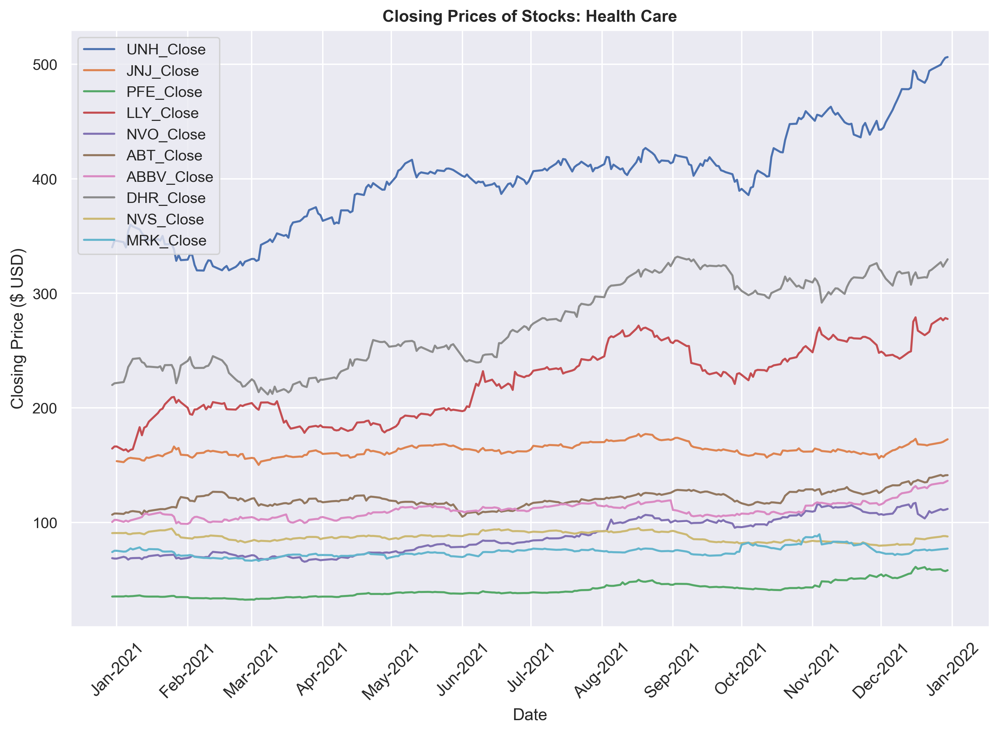

In [174]:
plot_prices(df_tickers, 'Health Care')

['JPM', 'BAC', 'WFC', 'MS', 'SCHW', 'BLK', 'AMT', 'GS', 'AXP', 'HSBC']


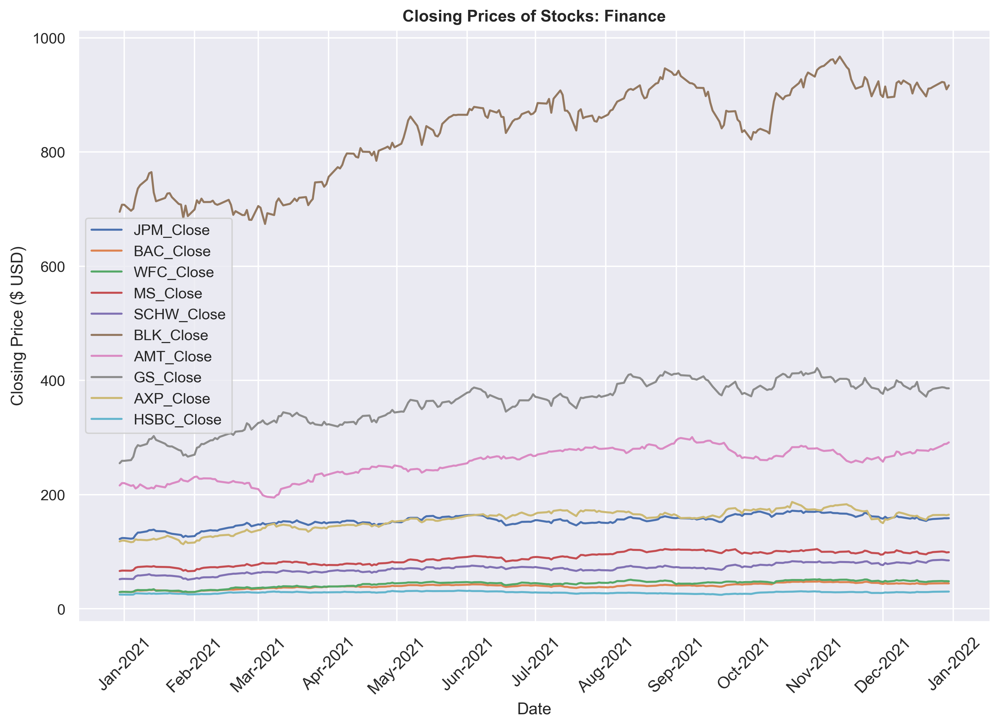

In [175]:
plot_prices(df_tickers, 'Finance')

['AMZN', 'HD', 'WMT', 'DIS', 'NFLX', 'COST', 'CMCSA', 'MCD', 'T', 'LOW']


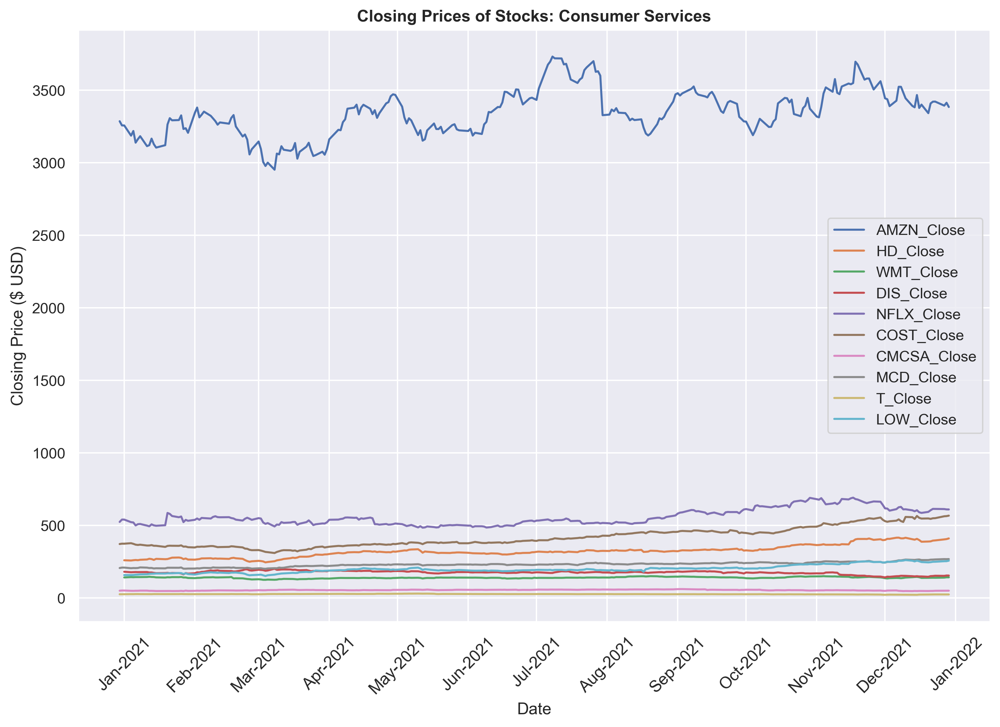

In [176]:
plot_prices(df_tickers, 'Consumer Services')

['AAPL', 'MSFT', 'GOOGL', 'GOOG', 'FB', 'NVDA', 'TSM', 'ASML', 'AVGO', 'ADBE']


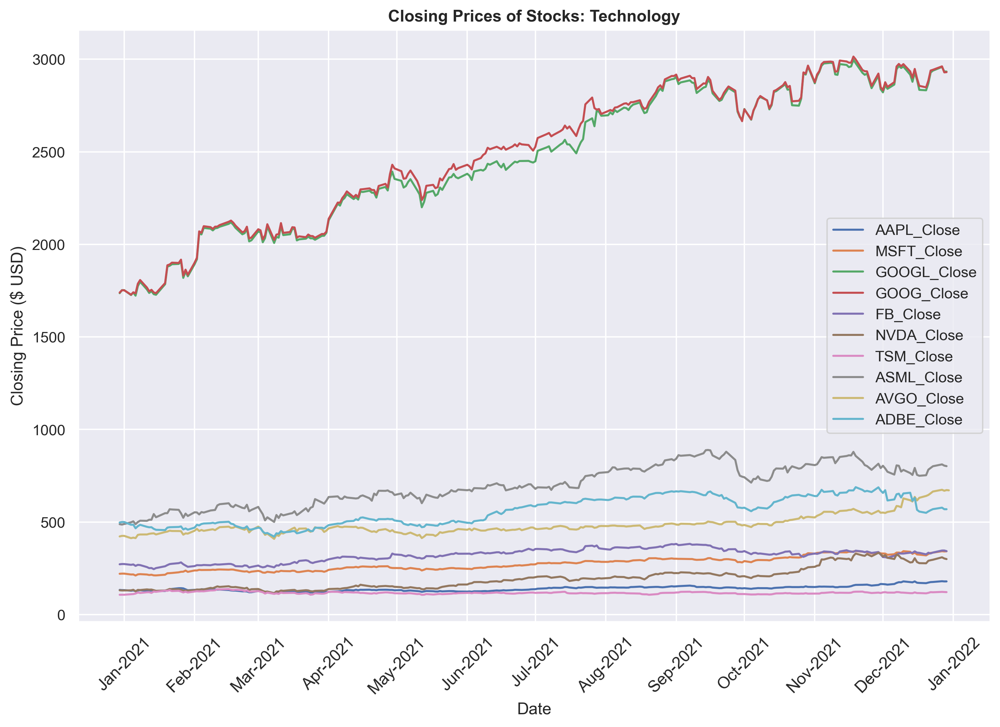

In [177]:
plot_prices(df_tickers, 'Technology')

['TSLA', 'TMO', 'TM', 'AMAT', 'RTX', 'BA', 'CAT', 'DE', 'CX', 'LMT']


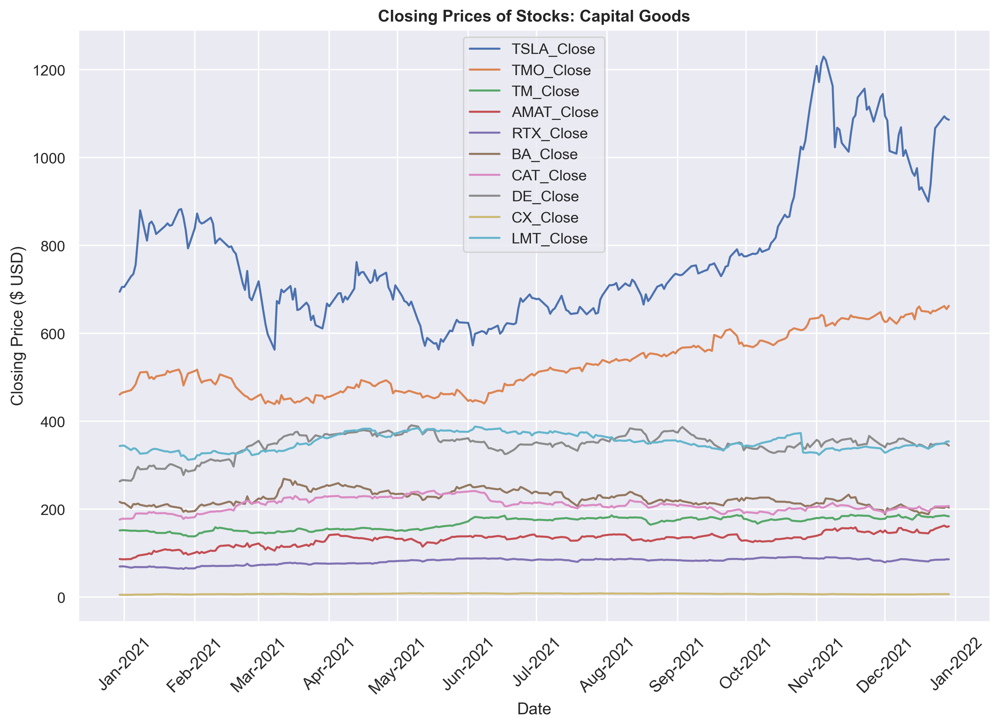

In [178]:
plot_prices(df_tickers, 'Capital Goods')

['LIN', 'BHP', 'RIO', 'SHW', 'APD', 'VALE', 'FCX', 'NEM', 'KMB', 'SCCO']


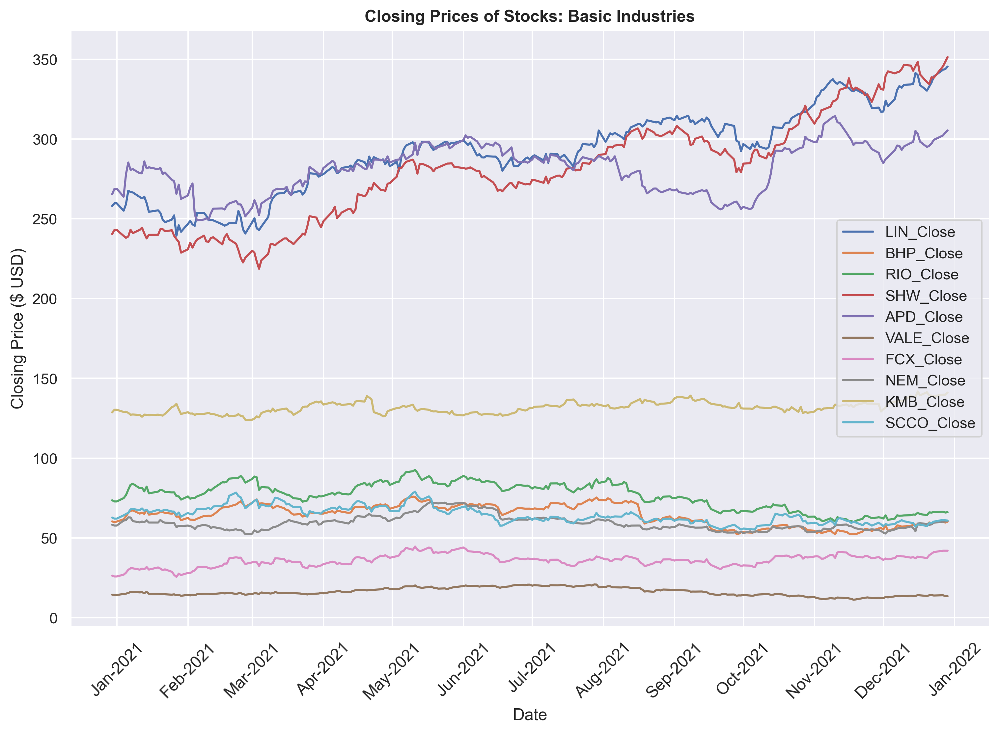

In [179]:
plot_prices(df_tickers, 'Basic Industries')

['XOM', 'CVX', 'BBL', 'TTE', 'COP', 'BP', 'EQNR', 'PTR', 'ENB', 'PBR']


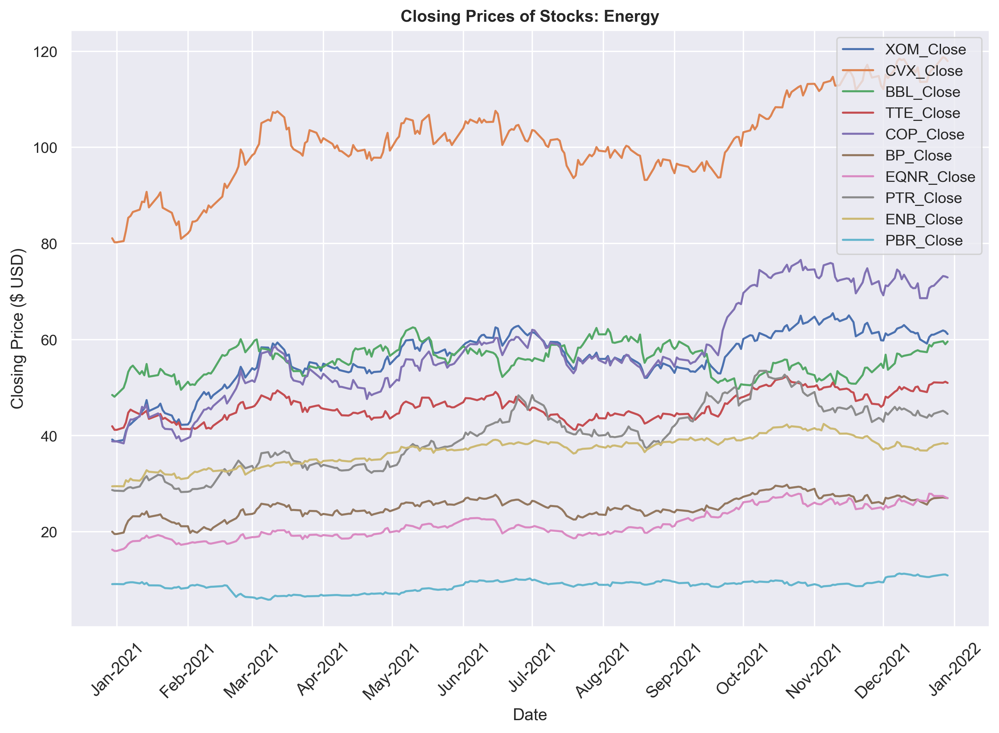

In [180]:
plot_prices(df_tickers, 'Energy')

['GE', 'ABB', 'FERG', 'AME', 'BLL', 'GNRC', 'CLX', 'AMCR', 'VTRS', 'PLUG']


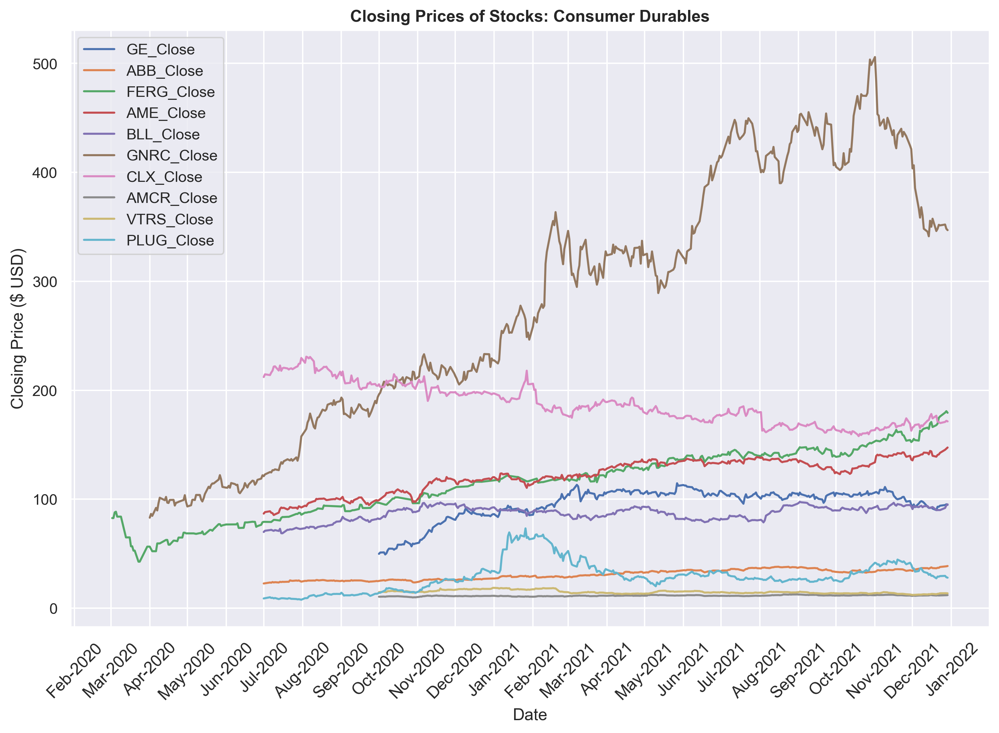

In [187]:
plot_prices(df_tickers, 'Consumer Durables')

['PG', 'NKE', 'KO', 'PEP', 'SONY', 'PM', 'UL', 'EL', 'DEO', 'BUD']


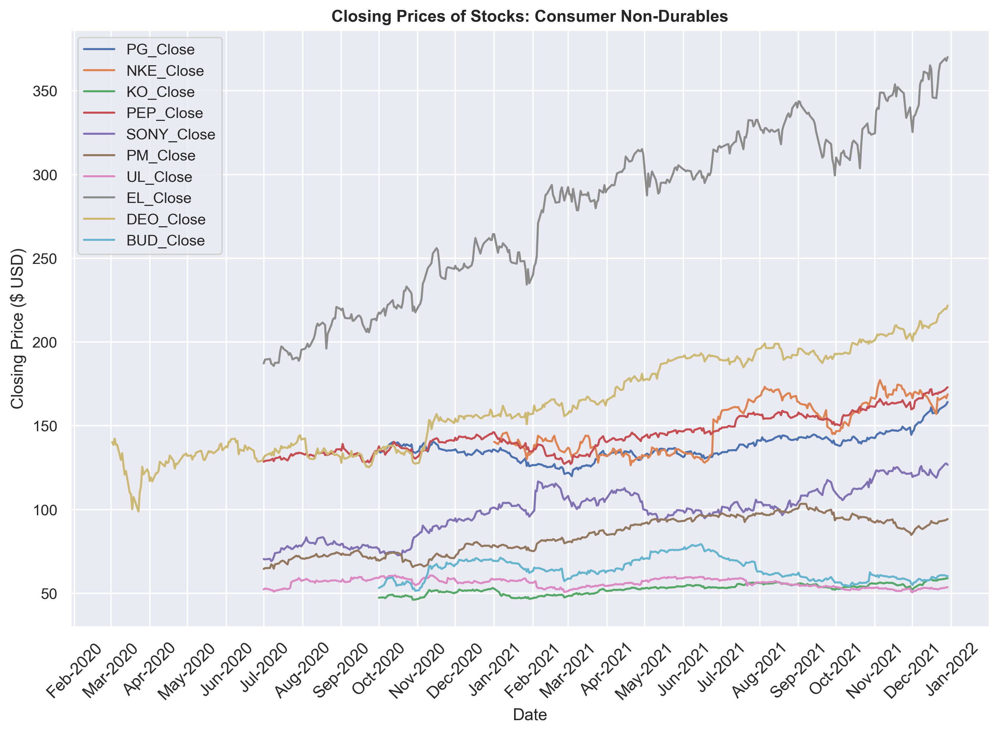

In [188]:
plot_prices(df_tickers, 'Consumer Non-Durables')

['VZ', 'NEE', 'TMUS', 'DUK', 'SO', 'WM', 'AMX', 'AMOV', 'D', 'EXC']


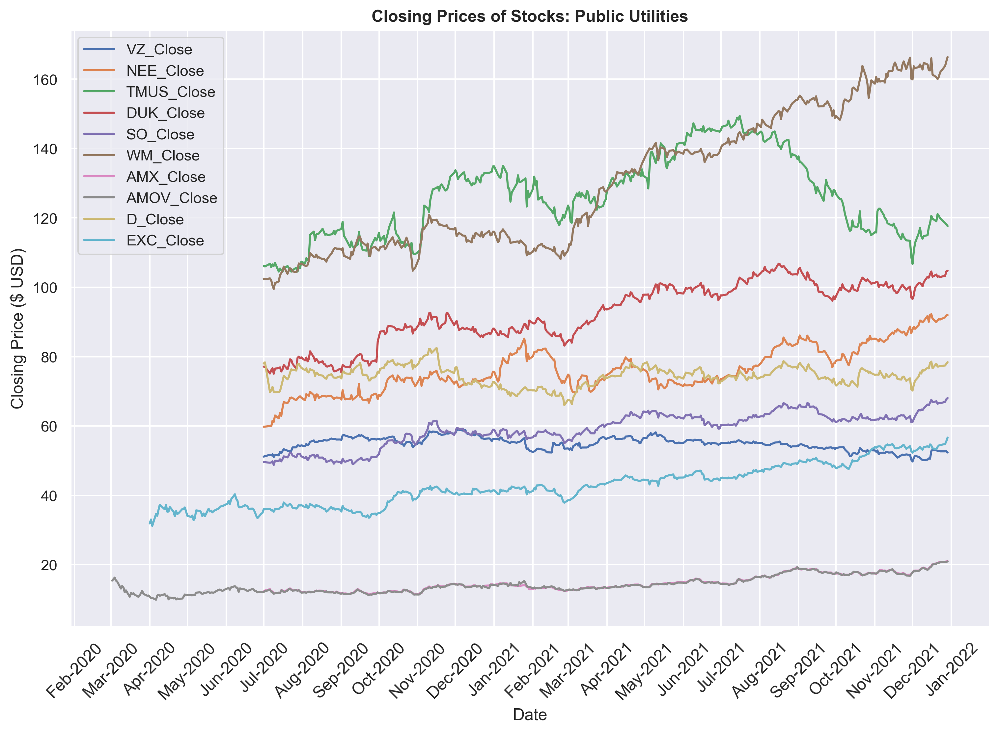

In [189]:
plot_prices(df_tickers, 'Public Utilities')

['UPS', 'UNP', 'ABNB', 'BKNG', 'CSX', 'NSC', 'FDX', 'ODFL', 'EXPE', 'DAL']


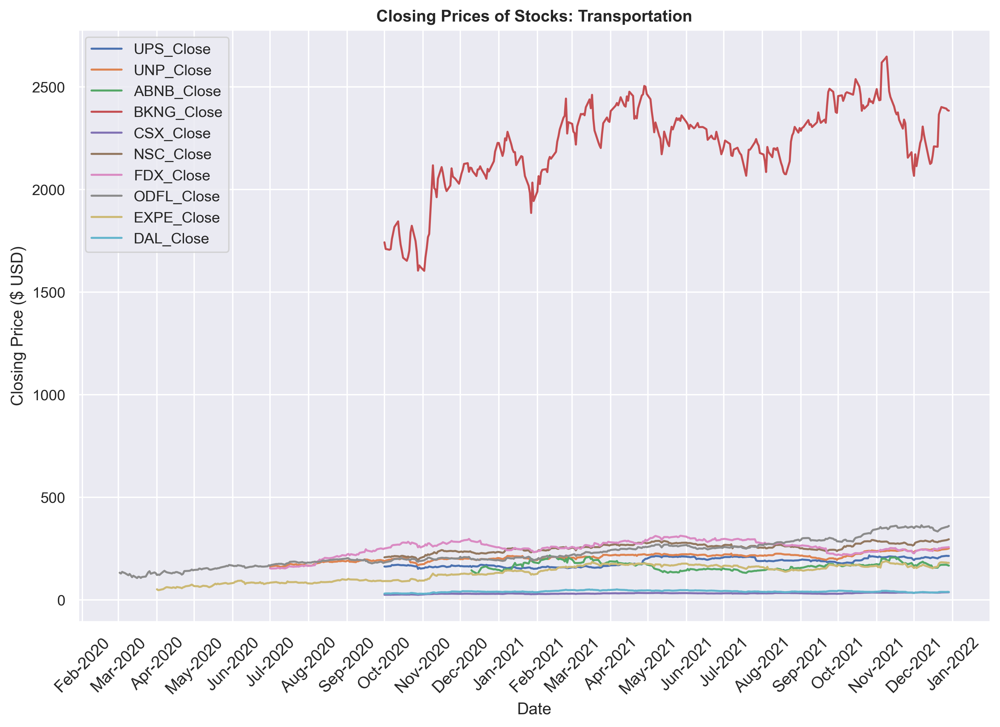

In [190]:
plot_prices(df_tickers, 'Transportation')

['V', 'MA', 'BABA', 'ACN', 'NTES', 'PYPL', 'ADP', 'JD', 'BAM', 'PDD']


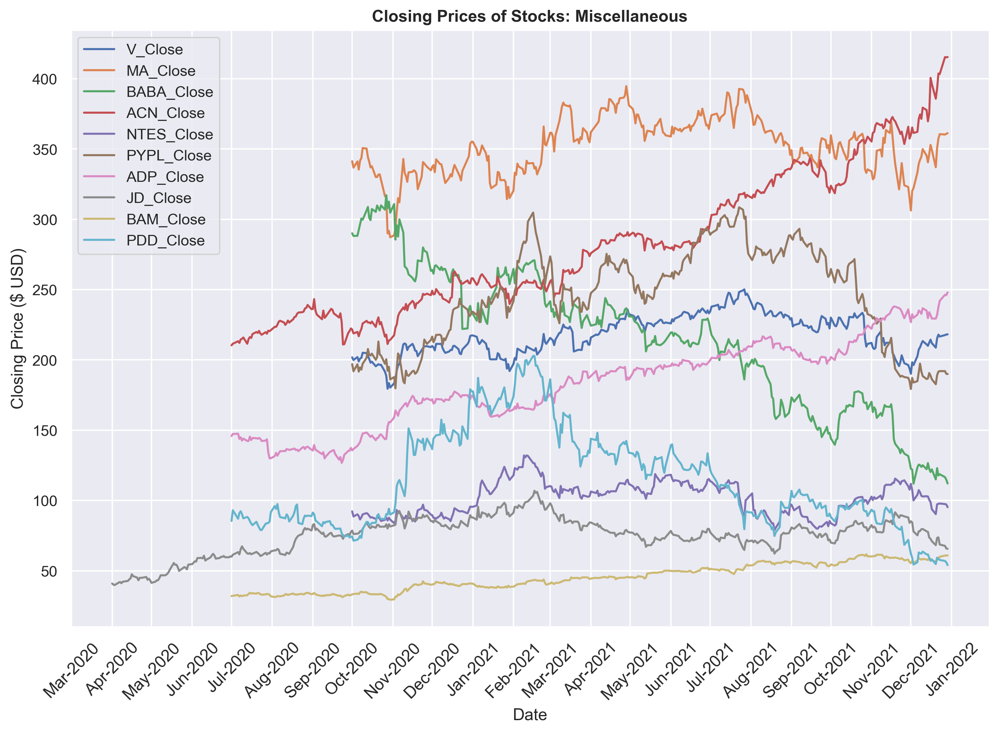

In [191]:
plot_prices(df_tickers, 'Miscellaneous')

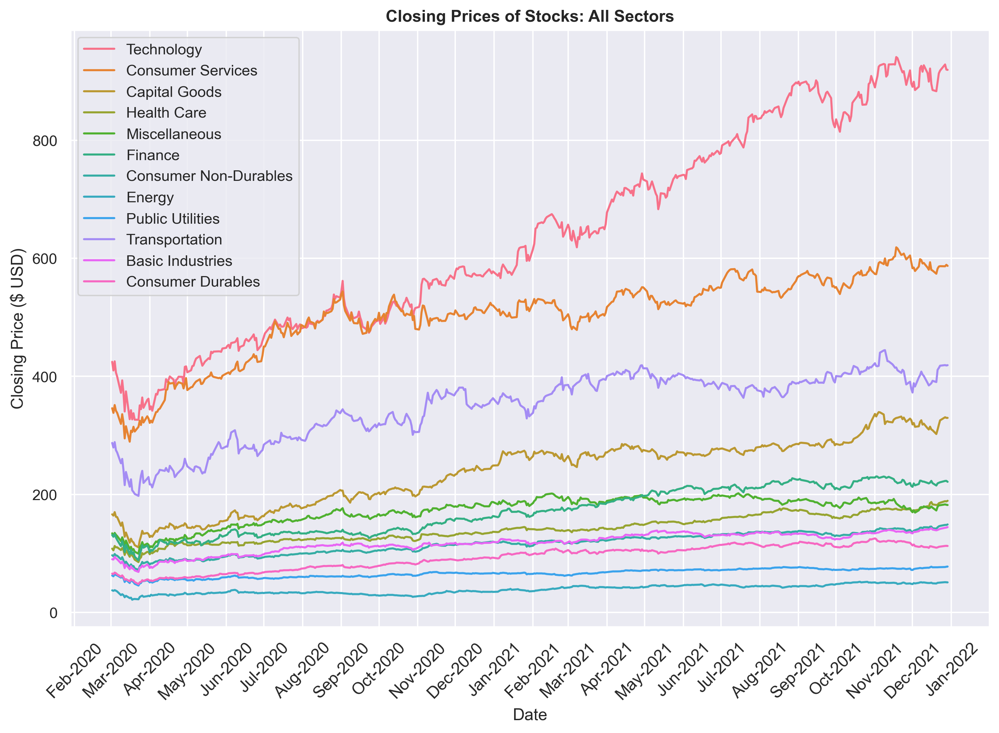

In [192]:
plot_sector_prices(df_sector)  

### 3.5. Stock Clustering During COVID-19

In [ ]:
# create clustering function, percent change columns of closing price
def plot_cluster_sector(df_tickers, sector):
    
    # get top 10 tickers for sector, process, and filter columns for closing prices
    tickers = top_tickers(df_tickers, sector)
    df = stock_preprocess(tickers)
    cols = df.columns[df.columns.str.contains(pat = 'Close')] 
    df = df[cols]
    df = df.rename(columns=lambda x: x.replace('_Close', ''))
    
    # fill in sentiment results
    df = df.replace(0,)
    df = df.interpolate('linear')
    df = df.dropna()
    
    # transpose news orgs and dates
    df = df.transpose()
 
    # create labels
    labels = list(df.index)

    # create linkages
    Z = linkage(df, 'ward')

    # make the dendrogram
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)  
    plt.title('Hierarchical Clustering Dendrogram', fontweight = 'bold')
    plt.xlabel('stocks')
    plt.ylabel('distance (Ward)')
    dendrogram(Z, labels=df.index, leaf_rotation=90)
    plt.show() 
    
_ = plot_cluster_sector(df_tickers, sector = ['Technology'])

### 3.6. Financial News Sentiment By Source 

In [ ]:
def plot_sentiment(df):
    
    # get top 10 tickers for sector, process, and filter columns for closing prices
    cols = df.columns[df.columns.str.contains(pat = '_sentiment')] 
    df = df[cols]
    df = df.rename(columns=lambda x: x.replace('_sentiment', ''))
    
    # fill in sentiment results
    df = df.replace(0,)
    df = df.interpolate('linear')
    df = df.dropna()
    df = df.resample('M').mean()
    
    # set seaborn style, plot options and plot closing prices
    sns.set()
    fig, ax = plt.subplots(figsize = (12,8), dpi=300)
    sns.lineplot(data=df, dashes=False)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
    plt.xticks(rotation=45, fontsize=12) 
    ax.set_title('Financial News Sentiment', fontweight ='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Sentiment (-1 = Neg., +1 = Pos.)')
    plt.show()
    
    # print highest sentiment to lowest sentiment news sources
    print('Average News Sentiment by Source: \n\n{}'.format(df.mean().sort_values(ascending=False)))

In [ ]:
plot_sentiment(df_news)

### 3.7. Stock Correlation to Financial News Sentiment

In [ ]:
# merge news dataframe overall sentiment with df_all dataframe
df_all = pd.merge(df_all, df_news[['overall_sentiment']], left_index=True, right_index=True, how='outer')

# filter for weekdays when stock price changes
df_all['day_of_week'] = df_all.index.dayofweek
df_all = df_all[(df_all['day_of_week'] >= 0) & (df_all['day_of_week'] <= 4)]

# print correlation values to determine stocks most correlated with news sentiment
correlation_mat = df_all.corr()
corr_pairs = correlation_mat.unstack()


In [ ]:
print('Stocks with highest correlation to news sentiment: \n\n{}'.format(corr_pairs['overall_sentiment'].sort_values(kind="quicksort", ascending=False).iloc[:10]))

### 3.8. Industry/Sector Correlation to Financial News Sentiment

In [ ]:
df_sector_industry = pd.concat([df_sector.reset_index(), df_industry], axis=1)
df_sector_industry = df_sector_industry.rename(columns={"index": "date"})
df_sector_industry = df_sector_industry.set_index('date')
df_sector_industry.tail()

In [ ]:
# merge news dataframe overall sentiment with df_all dataframe
df_all_2 = pd.merge(df_sector_industry, df_news[['overall_sentiment']], left_index=True, right_index=True, how='outer')

# filter for weekdays when stock price changes
df_all_2['day_of_week'] = df_all_2.index.dayofweek
df_all_2 = df_all_2[(df_all_2['day_of_week'] >= 0) & (df_all_2['day_of_week'] <= 4)]

# plot correlation heatmap across all stocks to view correlation
plt.figure(dpi=300)
sns.heatmap(df_all_2.corr()) 

# print correlation values to determine stocks most correlated with news sentiment
correlation_mat = df_all_2.corr()
corr_pairs = correlation_mat.unstack()


In [ ]:
print('Industries/Sectors with highest correlation to news sentiment: \n\n{}'.format(corr_pairs['overall_sentiment'].sort_values(kind="quicksort", ascending=False).iloc[:10]))

### 3.9 Stock Screener (by P/E Ratio, Earnings)

In [ ]:
# define function for generating stock history of each ticker and concatenate to master dataframe
def stock_pe_earnings(df):

    # create empty columns
    df = df.copy()
    df['trailingPE'] = ''
    df['earnings_0Q'] = ''
    df['earnings_1Q'] = ''
    df['earnings_2Q'] = ''
    df['earnings_3Q'] = '' 
    
    # loop over each stock ticker to get PE ratio
    for i, row in df.iterrows():
        
        # sleep
        time.sleep(1)
        
        try: 
            # input various stock tickers 
            ticker = yf.Ticker(row['Symbol'])
            stock_quarterly_earnings = ticker.quarterly_earnings
            stock_yearly_earnings = ticker.earnings
            stock_info = ticker.info       
        
        except:
            pass
        
        # quarterly earninga
        try:
            
            # get info
            df.loc[i, 'earnings_0Q'] = stock_quarterly_earnings['Earnings'][-1]
            df.loc[i, 'earnings_1Q'] = stock_quarterly_earnings['Earnings'][-2]
            df.loc[i, 'earnings_2Q'] = stock_quarterly_earnings['Earnings'][-3]
            df.loc[i, 'earnings_3Q'] = stock_quarterly_earnings['Earnings'][-4]
            
        except:
            
            df.loc[i, 'earnings_0Q'] = np.nan
            df.loc[i, 'earnings_1Q'] = np.nan
            df.loc[i, 'earnings_2Q'] = np.nan
            df.loc[i, 'earnings_3Q'] = np.nan
            
        # yearly earnings
        try:
            
            # get info
            df.loc[i, 'earnings_0Y'] = stock_yearly_earnings['Earnings'].iloc[-1]
            df.loc[i, 'earnings_1Y'] = stock_yearly_earnings['Earnings'].iloc[-2]
            df.loc[i, 'earnings_2Y'] = stock_yearly_earnings['Earnings'].iloc[-3]
            df.loc[i, 'earnings_3Y'] = stock_yearly_earnings['Earnings'].iloc[-4]
            
        except:
            
            df.loc[i, 'earnings_0Y'] = np.nan
            df.loc[i, 'earnings_1Y'] = np.nan
            df.loc[i, 'earnings_2Y'] = np.nan
            df.loc[i, 'earnings_3Y'] = np.nan
        
        # PE ratio
        try:
            
            df.loc[i, 'trailingPE'] = stock_info['trailingPE']
            
        except:
            
            df.loc[i, 'trailingPE'] = np.nan
                    
        time.sleep(2)
        
    # convert data types
    df = df.dropna(subset = ['trailingPE', 'earnings_0Q', 'earnings_1Q', 'earnings_2Q', 'earnings_3Q', 'earnings_0Y', 'earnings_1Y', 'earnings_2Y', 'earnings_3Y'], how='any')
    df['trailingPE'] = df['trailingPE'].astype(float)
    df['earnings_0Q'] = df['earnings_0Q'].astype(int)
    df['earnings_1Q'] = df['earnings_1Q'].astype(int)
    df['earnings_2Q'] = df['earnings_2Q'].astype(int)
    df['earnings_3Q'] = df['earnings_3Q'].astype(int)
    df['earnings_0Y'] = df['earnings_0Y'].astype(int)
    df['earnings_1Y'] = df['earnings_1Y'].astype(int)
    df['earnings_2Y'] = df['earnings_2Y'].astype(int)
    df['earnings_3Y'] = df['earnings_3Y'].astype(int)
    
    # get sector average pe
    df_sector_pe = df.groupby('Sector')['trailingPE'].mean().reset_index()
    df_sector_pe = df_sector_pe.rename(columns = {'trailingPE': 'sector_trailingPE'})
    
    # merge dataframes
    df = df.merge(df_sector_pe, on='Sector', how='left')
        
    return df


In [ ]:
#df_tickers = df_tickers[:1000]
mask = (df_tickers['Industry'] == 'Restaurants')
print(df_tickers.loc[mask])
df_pe_earnings = stock_pe_earnings(df_tickers.loc[mask])            
df_pe_earnings.head()

In [ ]:
def stock_filter(df, quarterly_growth_percent = None, yearly_growth_percent = None):
    
    # create columns variables
    quarterly_growth_str = 'quarterly_earnings_growth' + str(quarterly_growth_percent)
    quarterly_growth_percent = 1 + (quarterly_growth_percent/100)
    yearly_growth_str = 'yearly_earnings_growth' + str(yearly_growth_percent)
    yearly_growth_percent = 1 + (yearly_growth_percent/100)    
    
    # create empty columns
    df['quarterly_earnings_growth'] = ''
    df[quarterly_growth_str] = ''
    df['yearly_earnings_growth'] = ''
    df[yearly_growth_str] = ''
    
    for i, row in df.iterrows():
        
        
        # quarterly earnings (growth over last 3 quarters)
        if (row['earnings_0Q'] > quarterly_growth_percent*(row['earnings_1Q'])) and (row['earnings_1Q'] > quarterly_growth_percent*(row['earnings_2Q'])):
        
            df.loc[i, quarterly_growth_str] = 'Yes'
            
        else:
            
            df.loc[i, quarterly_growth_str] = 'No'  
            
            
        # yearly earnings (growth  2019 > 2018 > 2017, excluding 2020 since pandemic)      
        if ((row['earnings_1Y'] > yearly_growth_percent*(row['earnings_2Y'])) and (row['earnings_2Y'] > yearly_growth_percent*(row['earnings_3Y']))):
        
            df.loc[i, yearly_growth_str] = 'Yes'
            
        else:
            
            df.loc[i, yearly_growth_str] = 'No'            
            
         
    #df = df[(df[quarterly_growth_str] == 'Yes') & (df[yearly_growth_str] == 'Yes') &
    #       (df['trailingPE'] < df['sector_trailingPE'])]

    df = df[(df[yearly_growth_str] == 'Yes') &
           (df['trailingPE'] < df['sector_trailingPE'])]
    
    
            
    return df
    

In [ ]:
df_filtered = stock_filter(df_pe_earnings, quarterly_growth_percent = 1, yearly_growth_percent = 5)
df_filtered

## 4. Data Pipeline

## 5. Conclusion

This project performed data analysis on stocks and scraped news headlines and tried to answer the following questions. The answers and results are shown below:


### **Which stocks have the greatest rate of return before vs. during COVID-19?** 

The stocks with the highest returns include the following:

| ticker | pandemic_change% 
| :- | :-: 
| TSLA | 589.309 | 
| CVNA | 477.913 |  
| PDD | 290.054 | 
| GNRC | 282.471 | 
| MELI | 232.365 | 
| DE | 178.419 | 
| SCCO | 167.482 | 
| FDX | 162.865 | 
| ASML | 162.79 | 
| KMX | 153.724 | 

### **Which sectors have the greatest rate of return before vs. during COVID-19?**

The sectors with the highest returns include the following:

| sector | pandemic_change% 
| :- | :-: 
| Consumer Durables | 103.636663 | 
| Miscellaneous | 101.987157 |  
| Capital Goods | 99.840312 | 
| Technology | 95.468499 | 
| Transportation | 88.925665 | 
| Finance | 85.931560 | 
| Basic Industries | 57.395231 | 
| Consumer Services | 57.371112 | 
| Consumer Non-Durables | 50.414571 | 
| Energy | 46.359885 | 
| Public Utilities | 37.793667 | 
| Health Care | 36.989555 | 

### **Which industries have the greatest rate of return before vs. during COVID-19?**

The industries with the highest returns include the following:

| industry | pandemic_change% 
| :- | :-: 
| Auto Manufacturing | 304.387023 | 
| Engineering & Construction | 156.161482 |  
| Shoe Manufacturing | 127.565042 | 
| Restaurants | 111.543056 | 
| Semiconductors | 103.183557 | 
 
### **How have sector stock prices changed over time during COVID-19?**

The changes in price for all stock sectors is plotted in section 3.4 stock sector prices over time. All sectors show a positive return, with some sectors showing higher growth (e.g. Technology) than others (e.g. Health Care). See section 3.4 for the stock price changes for the leading stocks in each sector. 

### **Can stock price changes be used to cluster groups of individual stocks?**

In section 3.5 stock clustering during COVID-19, a dendogram was plotted for a sample of stocks (the top 10 stocks in Technology sector). The heirarichical clustering dendogram showed the clustering of stock prices in terms of euclidean distance, based on the ward method (minimize variance within each cluster). The results show the strongest clustering between Google (GOOG and GOOGL, obviously), Microsoft and Salesforce (MSFT and CRM), Adobe and Nvidia (ADBE and NVDA), and Apple and Intel (AAPL and INTC). 

### **Which financial news sources have the highest/lowest headline sentiment?**

In section 3.6 financial news sentiment by source, the various scraped news headlines strings were converted to sentiment and resampled daily over time. The most positive news sentiment was found to be Motley Fool, Seeking Alpha and Morninstar. The most negative news sentiment was found to be Economist, CNN Business, and Financial Times. 

### **Which stocks are correlated to financial news sentiment?**

In section 3.7 stock correlation to financial news sentiment, the correlation between stock prices and news sentiment was analyzed. The stocks with the strongest positive correlation to news sentiment, in terms of pearson correlation coefficient, was found to be Fedex (0.422833), Ball Corporation (0.422745), Copart (0.399580), Costco (0.399254), and United Parcel Service (0.353451).  

### **Which sectors/industries are correlated to financial news sentiment?**

In section 3.8 sector/industry correlation to financial news sentiment, the correlation between sectors/industries and news sentiment was analyzed. The sectors/industries with the strongest positive correlation to news sentiment, in terms of pearson correlation coefficient, was found to be Department/Specialty Retail Stores (0.396246), Apparel (0.371543), Air Freight/Delivery Services (0.336459), and Containers/Packaging (0.331440). A correlation heatmap was also plotted to visually show the results. 

### **Can we screen stocks that are good value based on average sector Price/Earnings ratio, and quarterly growth percent?**

In section 3.9, a stock screener based on Price/Earnings ratio (trailing P/E), and quarterly earnings was created, in order to find stocks that are a good value to invest. The screener filtered the top 50 stocks by market cap. The first criteria in filtering stocks was finding stocks with a Price/Earnings ratio that was lower than the average Price/Earnings ratio in that stock's sector. The second criteria was finding stocks with quarterly growth of at least 5% in each of the last four quarters. The resulting stocks that matched this criteria include Facebook, JP Morgan and Chase, Toyota, and Thermo Fisher Scientific. In future work, the screener can be easily adjusted to screen based on other criteria such as yearly earnings, higher earnings growth (e.g. 10% quarter over quarter/year over year), and other metrics. 